# Notebook containing code used for manuscript supplementary figure 5

### Change each file path to the relevant local folder after downloading the data

In [78]:
import anndata
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
pio.renderers.default='iframe'
import seaborn as sns
import numpy as np
import pandas as pd
import statsmodels.api as sm
from scipy import stats
from scipy.sparse import csr_matrix
from sklearn import linear_model

import cv2
from skimage.segmentation import find_boundaries

import commot as ct
import spateo as st
import dynamo as dyn
#import ncem
#from ncem.data import get_data_custom, customLoader

import torch
from torch import nn

import pickle
import os
import sys
from tqdm import tqdm

from scipy.spatial import KDTree
from scipy.stats import norm

In [2]:
np.random.seed(0)

In [3]:
%config InlineBackend.print_figure_kwargs={'dpi': 300.0}

In [119]:
# Helper function (for Figs. S5k-l formatting):
def replace_col_with_collagens(string):
    # Split the string at the colon (if any)
    parts = string.split(":")
    # Split the first part of the string at slashes
    elements = parts[0].split("/")
    # Flag to check if we've encountered a "COL" element or a "Collagens" element
    encountered_col = False

    # Process each element
    for i, element in enumerate(elements):
        # If the element starts with "COL" or "b_COL", or if it is "Collagens" or "b_Collagens"
        if (
            element.startswith("COL")
            or element.startswith("b_COL")
            or element.startswith("Col")
            or element.startswith("b_Col")
            or element in ["Collagens", "b_Collagens"]
        ):
            # If we've already encountered a "COL" or "Collagens" element, remove this one
            if encountered_col:
                elements[i] = None
            # Otherwise, replace it with "Collagens" or "b_Collagens" as appropriate
            else:
                if element.startswith("b_COL") or element.startswith("b_Col") or element == "b_Collagens":
                    elements[i] = "b_Collagens"
                else:
                    elements[i] = "Collagens"
                encountered_col = True

    # Remove None elements and join the rest with slashes
    replaced_part = "/".join([element for element in elements if element is not None])
    # If there's a second part, add it back
    if len(parts) > 1:
        replaced_string = replaced_part + ":" + parts[1]
    else:
        replaced_string = replaced_part

    return replaced_string

# Digitization

## Resources used for the digitization benchmarks (Visium mouse brain, MERFISH U2-OS, and MERFISH mouse cortex) can all be found here (along with files for the Figure 5 digitization materials): https://www.dropbox.com/scl/fo/4tyq5nbex7e2yo3anuemy/AA2p0y9ZAnN6oLWgAtoWA-0?rlkey=jdnxyg8jwx17iexxyn8dvqi7y&st=rsf779qu&dl=0

## The fitEC R package and slideseq_helpers file can also be found in folders within this Dropbox folder 

In [4]:
# Add slideseq_helpers folder to path
sys.path.insert(0, '/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_digitization_materials/raphael-group-belayer-bb7b493/src')

## Install the fitEC package here if not already done

In [ ]:
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
from rpy2.robjects import r
import os

os.environ['R_HOME'] = '/usr/lib/R'
utils = importr('utils')
fitec_path = '/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_digitization_materials/fitEC_0.1.0.tar.gz'
utils.install_packages(fitec_path, repos = r('NULL'), type = "source")
fitec = importr('fitEC')

### Figure S5a- Visium mouse brain

In [5]:
adata = st.read_h5ad("/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_digitization_materials/visium_adata.h5ad")
adata.uns['__type'] = "UMI"
adata

AnnData object with n_obs × n_vars = 2823 × 32285
    obs: 'cluster', 'cortex'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '__type'
    obsm: 'X_spatial', 'spatial'

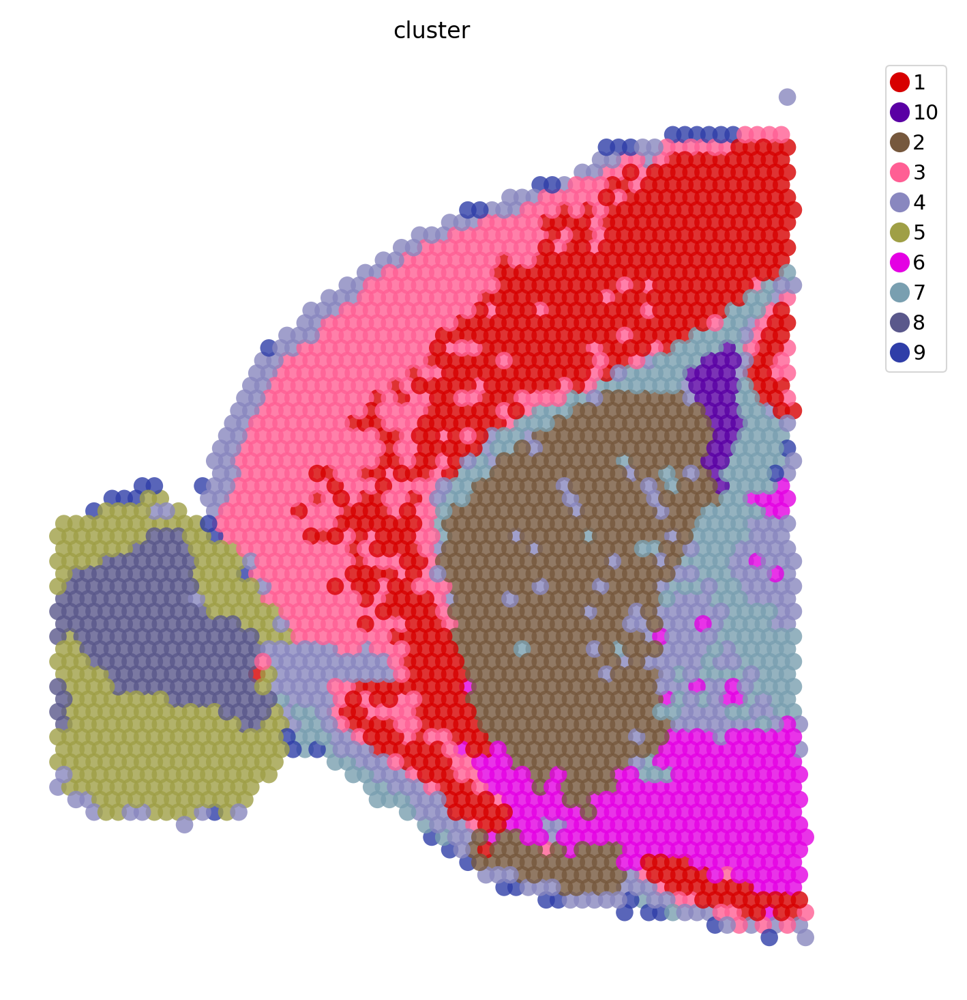

In [6]:
st.pl.space(adata=adata, color='cluster', pointsize=0.5, show_legend="upper left")

In [7]:
adata.obsm['spatial_bin30'] = adata.obsm['spatial']//100
cluster_label_image_lowres = st.dd.gen_cluster_image(adata, bin_size=1, spatial_key="spatial_bin30", cluster_key='cluster', show=False)
cluster_label_list = np.unique(adata[adata.obs['cluster'].isin(['1', '3']), :].obs["cluster_img_label"])
contours, cluster_image_close, cluster_image_contour = st.dd.extract_cluster_contours(cluster_label_image_lowres, cluster_label_list, bin_size=1, k_size=3, show=False, min_area=1000)
px.imshow(cluster_image_contour, width=500, height=500)

|-----> Set up the color for the clusters with the tab20 colormap.
|-----> Saving integer labels for clusters into adata.obs['cluster_img_label'].
|-----> Prepare a mask image and assign each pixel to the corresponding cluster id.
|-----> Get selected areas with label id(s): [1 4].
|-----> Close morphology of the area formed by cluster [1 4].
|-----> Remove small region(s).
|-----> Extract contours.


In [8]:
# User input to specify a gridding direction
pnt_xY = (10,63)
pnt_xy = (14,59)
pnt_Xy = (76,98)
pnt_XY = (64,98)

# Digitize the area of interest
st.dd.digitize(
    adata=adata,
    ctrs=contours,
    ctr_idx=0,
    pnt_xy=pnt_xy,
    pnt_xY=pnt_xY,
    pnt_Xy=pnt_Xy,
    pnt_XY=pnt_XY,
    spatial_key="spatial_bin30"
)

|-----> Initialize the field of the spatial domain of interests.
|-----> Prepare the isoline segments with either the highest/lower column or layer heat values.
|-----> Solve the layer heat equation on spatial domain with the iso-layer-line conditions.
|-----> Total iteration: 763
|-----> Saving layer heat values to digital_layer.
AAACAAGTATCTCCCA-1    0.0
AAACACCAATAACTGC-1    0.0
AAACAGAGCGACTCCT-1    0.0
AAACAGCTTTCAGAAG-1    0.0
AAACAGGGTCTATATT-1    0.0
                     ... 
TTGTTAGCAAATTCGA-1    0.0
TTGTTCAGTGTGCTAC-1    0.0
TTGTTGTGTGTCAAGA-1    0.0
TTGTTTCATTAGTCTA-1    0.0
TTGTTTCCATACAACT-1    0.0
Name: digital_layer, Length: 2823, dtype: float64
|-----> Solve the column heat equation on spatial domain with the iso-column-line conditions.
|-----> Total iteration: 779
|-----> Saving column heat values to digital_column.


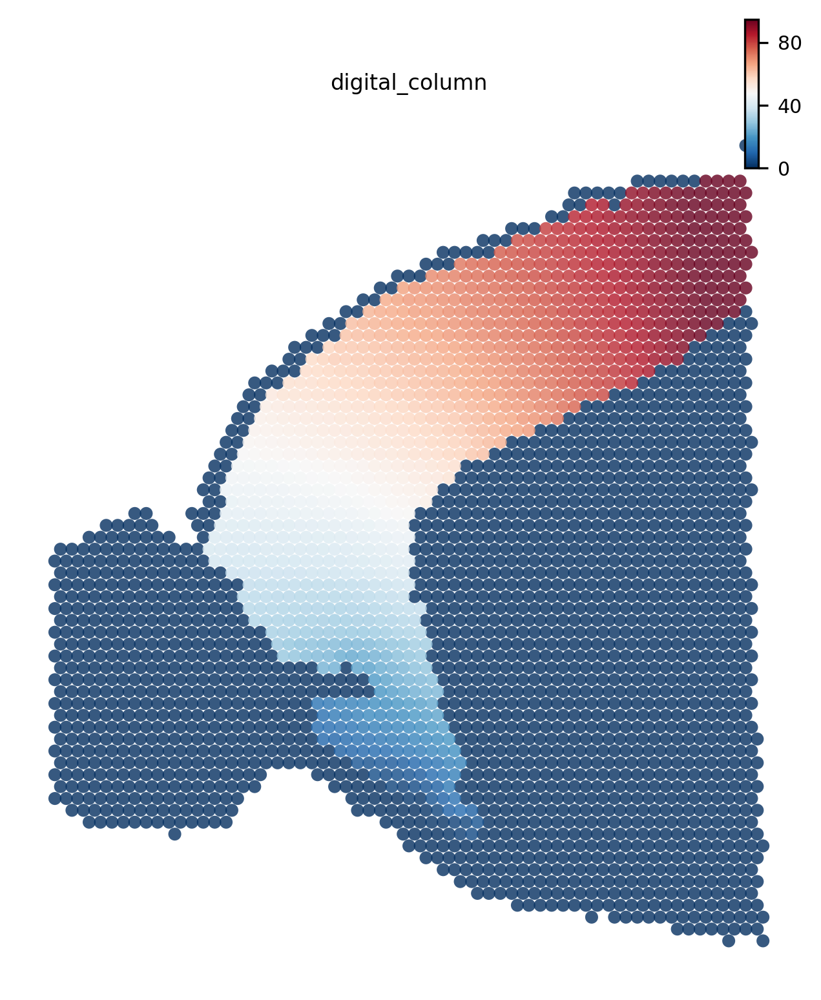

In [9]:
st.pl.space(adata, color="digital_column", cmap = "RdBu_r")

### Figure S5b- Gradients along the mouse cortex A-P axis

In [10]:
adata.uns['pp'] = {}
dyn.pp.normalize_cell_expr_by_size_factors(adata)

|-----> Set <adata.X> to normalized data


In [11]:
def polarity(
    adata,
    gene_dict: dict,
    region_key: str,
    palette: list,
    mode: str = "density",
    itv_rpt: int = 1,
    width: int = 5,
    height: int = 3.5,
):
    """Simple function to visualize expression level varies along regions.

    Args:
        adata (AnnData): _description_
        gene_dict (dict): _description_
        region_key (str): _description_
        mode (str, optional): _description_. Defaults to "density".

    Returns:
        _type_: _description_
    """

    import scipy.stats as stat
    digi_region = np.array([])
    gene_list = np.array([])
    gene_mean = np.array([])
    gene_mean_low = np.array([])
    gene_mean_high = np.array([])


    if mode == "exp":
        for i in np.unique(adata.obs[region_key]):
            adata_tmp = adata[adata.obs[region_key] == i, :]
            for anno in list(gene_dict.keys()):
                for gene in gene_dict[anno]:
                    gene_mean_tmp = adata_tmp[:, gene].X.toarray().T[0]
                    digi_region = np.append(digi_region, np.repeat(i,len(adata_tmp)))
                    gene_list = np.append(gene_list, np.repeat(gene + " " + anno,len(adata_tmp)))
                    gene_mean = np.append(gene_mean, gene_mean_tmp)
        df_plt = pd.DataFrame({region_key: digi_region, "Gene": gene_list, "Mean expression": gene_mean})
        ax = sns.relplot(data=df_plt, x=region_key, y="Mean expression", hue="Gene")
    elif mode == "density":
        for i in np.unique(adata.obs[region_key]):
            adata_tmp = adata[adata.obs[region_key] == i, :]
            for anno in list(gene_dict.keys()):
                for gene in gene_dict[anno]:
                        digi_region = np.append(digi_region, i)
                        gene_list = np.append(gene_list, gene + " " + anno)
                        gene_mean = np.append(gene_mean, np.mean(adata_tmp[:, gene].X))
                        data = adata_tmp[:, gene].X.toarray().T[0]
                        data = np.repeat(data,itv_rpt)
                        l, h = stat.t.interval(alpha=0.90, df=len(data)-1, loc=np.mean(data), scale=stat.sem(data))
                        if np.isnan(l):
                            l = np.mean(data)
                        if np.isnan(h):
                            h = np.mean(data)
                        gene_mean_low = np.append(gene_mean_low, max(0,l))
                        gene_mean_high = np.append(gene_mean_high,h)
        gene_mean_low = gene_mean_low + 1e-10
        gene_mean_high = gene_mean_high + 1e-10
        df_plt = pd.DataFrame({region_key: digi_region, "Gene": gene_list, "Mean expression": gene_mean})
        plt.figure()
        p1 = sns.kdeplot(data=df_plt, x=region_key,common_norm=False, weights="Mean expression", hue="Gene")
        #p1.set_xlim(0, max(adata.obs[region_key]))
        plt.close()
        df_plt = pd.DataFrame({region_key: digi_region, "Gene": gene_list, "Mean expression": gene_mean_low})
        plt.figure()
        p2 = sns.kdeplot(data=df_plt, x=region_key,common_norm=False, weights="Mean expression", hue="Gene")
        #p2.set_xlim(0, max(adata.obs[region_key]))
        plt.close()
        df_plt = pd.DataFrame({region_key: digi_region, "Gene": gene_list, "Mean expression": gene_mean_high})
        plt.figure()
        p3 = sns.kdeplot(data=df_plt, x=region_key,common_norm=False, weights="Mean expression", hue="Gene")
        #p3.set_xlim(0, max(adata.obs[region_key]))
        plt.close()
        fig, ax = plt.subplots()
        fig.set_size_inches((width,height))
        uq_gl = np.unique(gene_list)
        for k in range(len(uq_gl)):
            ax.plot(p1.get_children()[k].get_data()[0], p1.get_children()[k].get_data()[1], '-', color=palette[len(palette)-k-1])
            ax.fill_between(
                p1.get_children()[k].get_data()[0],
                p2.get_children()[k].get_data()[1]*np.sum(gene_mean_low[gene_list==uq_gl[-(k+1)]]) / np.sum(gene_mean[gene_list==uq_gl[-(k+1)]]),
                p3.get_children()[k].get_data()[1]*np.sum(gene_mean_high[gene_list==uq_gl[-(k+1)]])/ np.sum(gene_mean[gene_list==uq_gl[-(k+1)]]), color=palette[len(palette)-k-1], alpha=0.1)
    return ax

In [12]:
# Guide:
# Blue: Epha7
# Orange: Epha5
# Green: Cntnap2
# Red: Nr2f1
# Purple: Lhx2

gene_dict = {
    '1': ['Epha7'],
    '2': ['Epha5'],
    '3': ['Cntnap2'],
    '4': ['Nr2f1'],
    '5': ['Lhx2'],
}

import matplotlib as mpl
palette = [mpl.colors.to_hex(i) for i in sns.color_palette("tab10",n_colors=len(gene_dict))]

(10.0, 40.0)

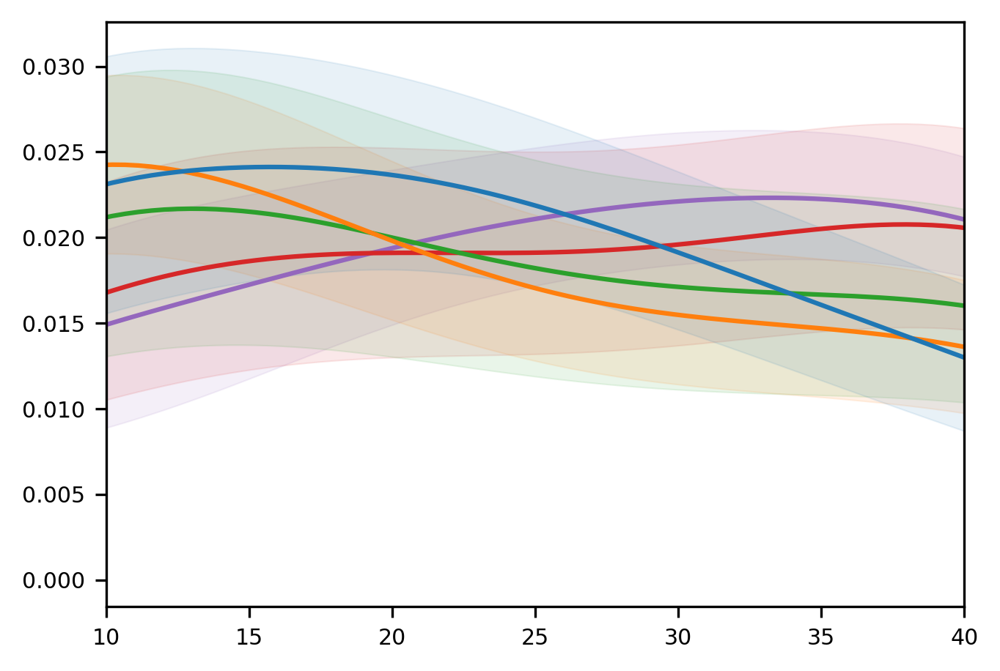

In [13]:
adata.obs['digital_column_25'] = adata.obs['digital_column'] // 2
ax = polarity(adata, gene_dict, region_key="digital_column_25", palette=palette,)
ax.tick_params(direction="out")
plt.xlim([10,40])

### Figure S5c- Nuclear boundary-enriched genes in the MERFISH U2-OS dataset

In [14]:
spot_adata_path = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_digitization_materials/spot.h5ad"

In [15]:
spot_adata = st.read_h5ad(spot_adata_path)
spot_adata

AnnData object with n_obs × n_vars = 1949 × 1949
    layers: 'batch0_cell_shape', 'batch0_nucleus_shape', 'batch0_nucleus_to_mem_digital', 'batch10_cell_shape', 'batch10_nucleus_shape', 'batch11_cell_shape', 'batch11_nucleus_shape', 'batch12_cell_shape', 'batch12_nucleus_shape', 'batch13_cell_shape', 'batch13_nucleus_shape', 'batch14_cell_shape', 'batch14_nucleus_shape', 'batch15_cell_shape', 'batch15_nucleus_shape', 'batch16_cell_shape', 'batch16_nucleus_shape', 'batch17_cell_shape', 'batch17_nucleus_shape', 'batch18_cell_shape', 'batch18_nucleus_shape', 'batch19_cell_shape', 'batch19_nucleus_shape', 'batch1_cell_shape', 'batch1_nucleus_shape', 'batch20_cell_shape', 'batch20_nucleus_shape', 'batch21_cell_shape', 'batch21_nucleus_shape', 'batch22_cell_shape', 'batch22_nucleus_shape', 'batch23_cell_shape', 'batch23_nucleus_shape', 'batch24_cell_shape', 'batch24_nucleus_shape', 'batch25_cell_shape', 'batch25_nucleus_shape', 'batch26_cell_shape', 'batch26_nucleus_shape', 'batch27_cell_sha

#### Digitization (can skip this step if "batch0_nucleus_to_mem_digital" is already a key in spot_adata.obs)

In [ ]:
def digital_loop(a, cell_bound, cell_shape, nucleus_labels, eps=1e4):
    a_pre = a.copy()
    while True:
        a_pri = conv_and_deal_with_non_cell(a_pre, 51, cell_shape, cell_bound, nucleus_labels)
        # print(abs(np.sum(a_pri - a_pre)))
        if abs(np.sum(a_pri - a_pre)) > eps:
            a_pre = a_pri.copy()
        else:
            break
    
    while True:     
        a_pri = conv_and_deal_with_non_cell(a_pre, 7, cell_shape, cell_bound, nucleus_labels)
        # print(abs(np.sum(a_pri - a_pre)))
        if abs(np.sum(a_pri - a_pre)) > eps:
            a_pre = a_pri.copy()
        else:
            return a_pri
        
def conv2d_by_torch(a, k=5, avg=False):
    assert k % 2 == 1
    a = a.astype(np.float32)
    a = torch.from_numpy(a[None,:])
    cov = nn.Conv2d(1, 1, kernel_size=k, stride=1, padding=int((k-1)/2),  bias=False)
    cov.weight = torch.nn.Parameter(torch.ones_like(cov.weight))
    c = cov(a)
    number= k*k if avg else 1
    return c.detach().numpy()[0]/number
    
def conv_and_deal_with_non_cell(a_pre, k, cell_shape, cell_bound, nucleus_labels):
    a_pri = conv2d_by_torch(a_pre, k=k, avg=True)
    a_pri = np.where(cell_shape==0, 100, a_pri) # non-cell: 100
    a_pri[np.where(cell_bound==1)] = 100 # cell boundary: 100
    a_pri[np.where(nucleus_labels>0)] = 0   # nuclear: 0
    return a_pri
    
def digital_adata(adata, cell_layer, nucleus_layer, out_layer, eps=1e3):
    id_of_cells_have_nucleus = np.unique(adata.layers[cell_layer][adata.layers[nucleus_layer]>0])
    cell_shape = np.where(np.isin(adata.layers[cell_layer], id_of_cells_have_nucleus), adata.layers[cell_layer], 0)
    cell_bound = find_boundaries(cell_shape, mode="inner").astype(np.uint8)
    nucleus_shape = adata.layers[nucleus_layer]
    dig_circle_init = np.where(cell_shape>0, 50, 100)
    dig_circle_init = np.where(nucleus_shape>0, 0, dig_circle_init)
    digital = digital_loop(dig_circle_init, cell_bound, cell_shape, nucleus_shape, eps)
    digital = np.where(cell_shape>0, digital, -1)
    adata.layers[out_layer] = digital

In [ ]:
digital_adata(spot_adata, 'batch0_cell_shape', 'batch0_nucleus_shape', out_layer='batch0_nucleus_to_mem_digital', eps=10)

In [ ]:
spot_adata.write_h5ad(spot_adata_path)

#### Visualize nuclear boundary

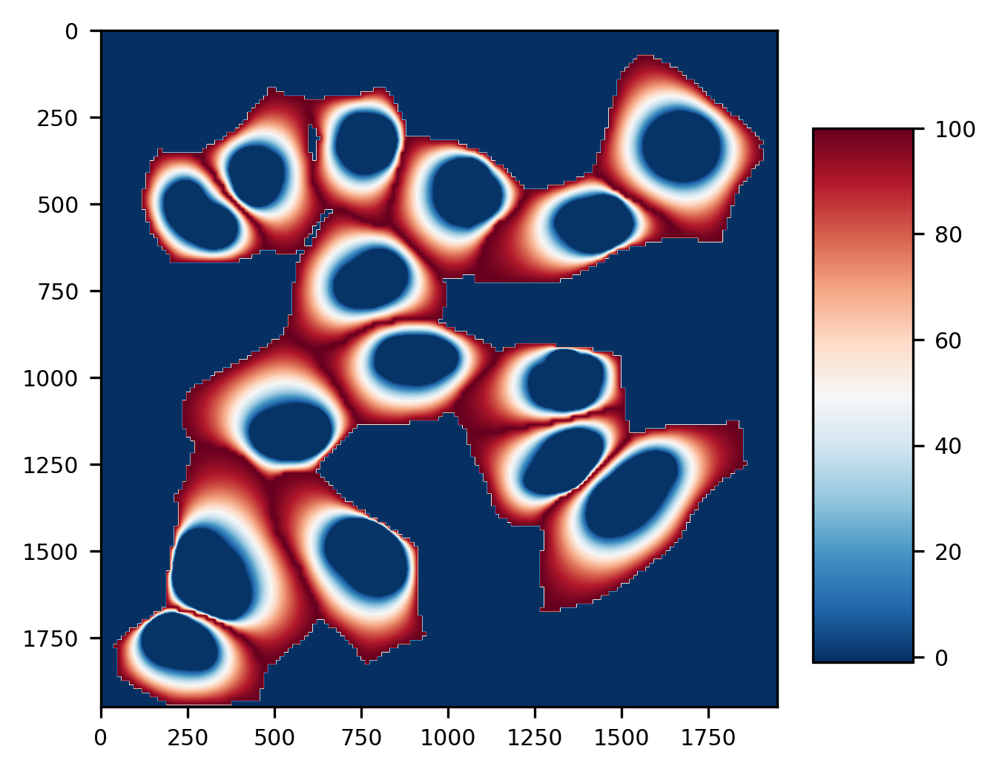

In [16]:
plt.imshow(spot_adata.layers['batch0_nucleus_to_mem_digital'])
cax = plt.axes([0.85, 0.2, 0.075, 0.6])
plt.colorbar(cax=cax)

#### MERFISH nuclear boundary line plots processing

In [22]:
adata = st.read_h5ad("/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_digitization_materials/u2os_merfish.h5ad")
adata

AnnData object with n_obs × n_vars = 1153 × 135
    obs: 'cell_shape', 'nucleus_shape', 'batch'
    uns: 'points'
    layers: 'spliced', 'unspliced'

In [23]:
def generate_long_matrix_df(adata, batch):
    df = adata.uns['points'].copy()
    df = df[df['batch']==batch]
    df['x_int'] = df['x'].astype(np.int32)
    df['y_int'] = df['y'].astype(np.int32)
    df = df[df['gene'].str.count('notarget')==0]
    df['count'] = 1
    return df

def generate_X_for_one_gene(df, gene):
    df = df.copy()
    df['cell_ids'] = df['cell'].cat.codes + 1
    df = df[df['gene'] == gene]
    X = csr_matrix((df['count'], (df['y_int'], df['x_int']))).toarray()
    return X

def reg_one_gene(df, spot_adata, digital_layer, gene):
    digital_one_gene_df = get_digital_info_for_one_gene(df, spot_adata, digital_layer, gene)
    clf = linear_model.LinearRegression() # LinearRegression PoissonRegressor
    clf.fit(y=digital_one_gene_df['expression'], X=digital_one_gene_df['digital_layer'][:,None])
    var = clf.score(y=digital_one_gene_df['expression'], X=digital_one_gene_df['digital_layer'][:,None])
    return var

def get_digital_info_for_one_gene(df, spot_adata, digital_layer, gene):
    X = generate_X_for_one_gene(df, gene)
    cell_ids = spot_adata.layers['batch0_cell_shape'][0:X.shape[0], 0:X.shape[1]]
    digital_one_gene = digital_layer[0:X.shape[0], 0:X.shape[1]]//10
    digital_one_gene_df = pd.DataFrame({'expression': X.flatten(), 'digital_layer': digital_one_gene.flatten(), 'cell_ids': cell_ids.flatten()})
    digital_one_gene_df = digital_one_gene_df[digital_one_gene_df['digital_layer']>0]
    digital_one_gene_df = digital_one_gene_df.groupby(['digital_layer', 'cell_ids']).agg('mean').reset_index()
    digital_one_gene_df['gene'] = gene
    return digital_one_gene_df

In [24]:
df = generate_long_matrix_df(adata, 0)
df

,x,y,gene,cell,nucleus,batch,x_int,y_int,count
4,1541.75090,124.650345,AKAP11,11-0,-1,0,1541,124,1
5,1526.97580,248.519300,AKAP11,11-0,-1,0,1526,248,1
6,1739.53400,363.478000,AKAP11,11-0,3,0,1739,363,1
7,1420.07250,542.724060,AKAP11,16-0,7,0,1420,542,1
8,1452.24240,563.947270,AKAP11,16-0,7,0,1452,563,1
...,...,...,...,...,...,...,...,...,...
199559,1713.29130,452.321000,RAB3B,11-0,-1,0,1713,452,1
199560,1036.16380,1056.410200,KIAA1147,21-0,-1,0,1036,1056,1
199561,656.27264,968.025450,UMPS,21-0,-1,0,656,968,1
199562,1699.85640,498.924300,GPR107,11-0,-1,0,1699,498,1


In [25]:
digital_layer = spot_adata.layers['batch0_nucleus_to_mem_digital'].astype(np.int32)

In [26]:
vars = []
for gene in np.unique(df['gene']):
    vars.append(reg_one_gene(df, spot_adata, digital_layer, gene))

var_df = pd.DataFrame({'var': vars, 'gene': np.unique(df['gene'])})

In [27]:
digital_6_gene_dfs = []
for gene in var_df.sort_values(by='var', ascending=False).head(3)['gene']:
    digital_6_gene_dfs.append(get_digital_info_for_one_gene(df, spot_adata, digital_layer, gene))
for gene in var_df.sort_values(by='var', ascending=False).tail(3)['gene']:
    digital_6_gene_dfs.append(get_digital_info_for_one_gene(df, spot_adata, digital_layer, gene))
digital_6_gene_df = pd.concat(digital_6_gene_dfs, ignore_index=True)

digital_6_gene_df

,digital_layer,cell_ids,expression,gene
0,1,1.0,0.001006,NOTCH2
1,1,2.0,0.010365,NOTCH2
2,1,3.0,0.004143,NOTCH2
3,1,4.0,0.002879,NOTCH2
4,1,5.0,0.002112,NOTCH2
...,...,...,...,...
895,10,11.0,0.000636,PHIP
896,10,13.0,0.000000,PHIP
897,10,15.0,0.000510,PHIP
898,10,16.0,0.000000,PHIP


#### MERFISH nuclear boundary line plot visualization

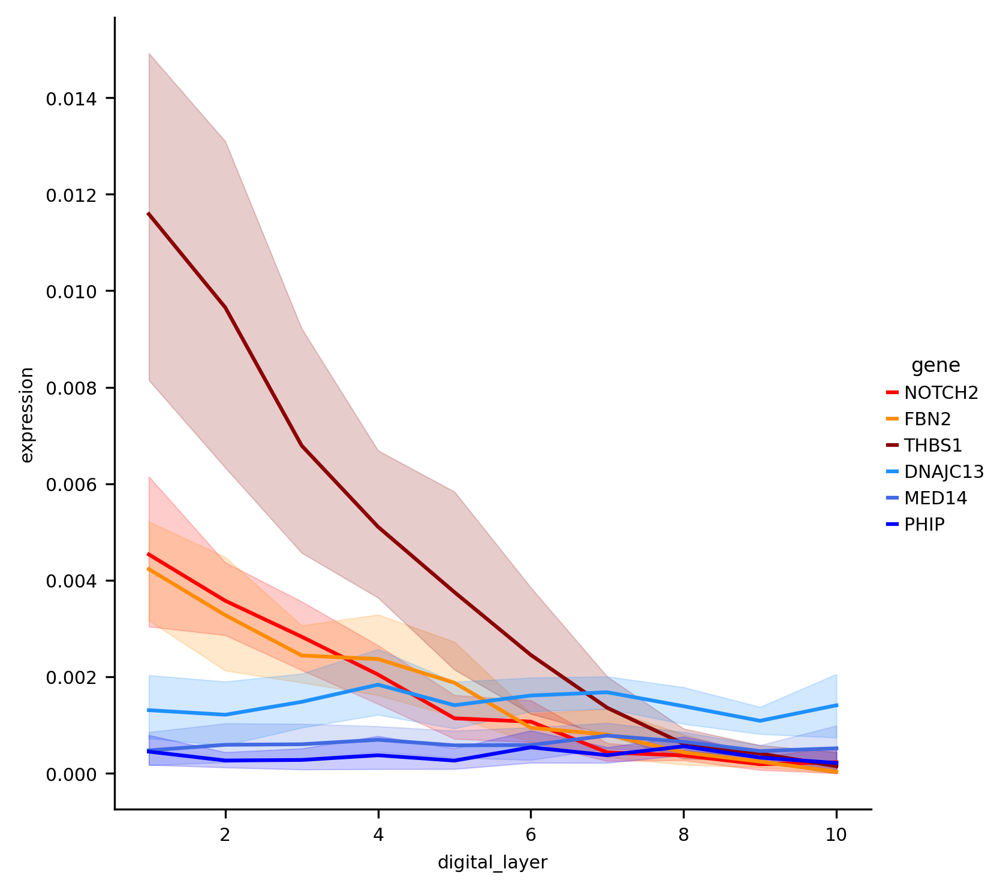

In [30]:
sns.relplot(data=digital_6_gene_df, x='digital_layer', y='expression', kind="line", hue='gene', palette=['red', 'darkorange', 'darkred', 'dodgerblue', 'royalblue', 'blue'])

### Figure S5d- Nuclear centroid-enriched genes in the MERFISH U2-OS dataset

In [31]:
df = generate_long_matrix_df(adata, 0)
df.x = df.x.astype(int)
df.y = df.y.astype(int)

df_tttmp = df.iloc[:1,:]
df_tttmp.x = 1
df_tttmp.y = 1

df = pd.concat([df,df_tttmp], axis=0)
df['MIDCount'] = df['count'].copy()
df['geneID'] = df['gene'].copy()
df.to_csv("tmp.csv",index=False,sep="\t")
df

,x,y,gene,cell,nucleus,batch,x_int,y_int,count,MIDCount,geneID
4,1541,124,AKAP11,11-0,-1,0,1541,124,1,1,AKAP11
5,1526,248,AKAP11,11-0,-1,0,1526,248,1,1,AKAP11
6,1739,363,AKAP11,11-0,3,0,1739,363,1,1,AKAP11
7,1420,542,AKAP11,16-0,7,0,1420,542,1,1,AKAP11
8,1452,563,AKAP11,16-0,7,0,1452,563,1,1,AKAP11
...,...,...,...,...,...,...,...,...,...,...,...
199560,1036,1056,KIAA1147,21-0,-1,0,1036,1056,1,1,KIAA1147
199561,656,968,UMPS,21-0,-1,0,656,968,1,1,UMPS
199562,1699,498,GPR107,11-0,-1,0,1699,498,1,1,GPR107
199563,1720,208,TPR,11-0,-1,0,1720,208,1,1,TPR


|-----> <select> tmp_img layer in AnnData Object
|-----> Set cell boundaries as value of 255
|-----> <insert> tmp_img_boundary to layers in AnnData Object.
|-----> <select> tmp_img layer in AnnData Object
|-----> Set cell boundaries as value of 255
|-----> <insert> tmp_img_boundary to layers in AnnData Object.
|-----> <select> tmp_img layer in AnnData Object
|-----> Set cell boundaries as value of 255
|-----> <insert> tmp_img_boundary to layers in AnnData Object.
|-----> <select> tmp_img layer in AnnData Object
|-----> Set cell boundaries as value of 255
|-----> <insert> tmp_img_boundary to layers in AnnData Object.
|-----> <select> tmp_img layer in AnnData Object
|-----> Set cell boundaries as value of 255
|-----> <insert> tmp_img_boundary to layers in AnnData Object.
|-----> <select> tmp_img layer in AnnData Object
|-----> Set cell boundaries as value of 255
|-----> <insert> tmp_img_boundary to layers in AnnData Object.
|-----> <select> tmp_img layer in AnnData Object
|-----> Set cel

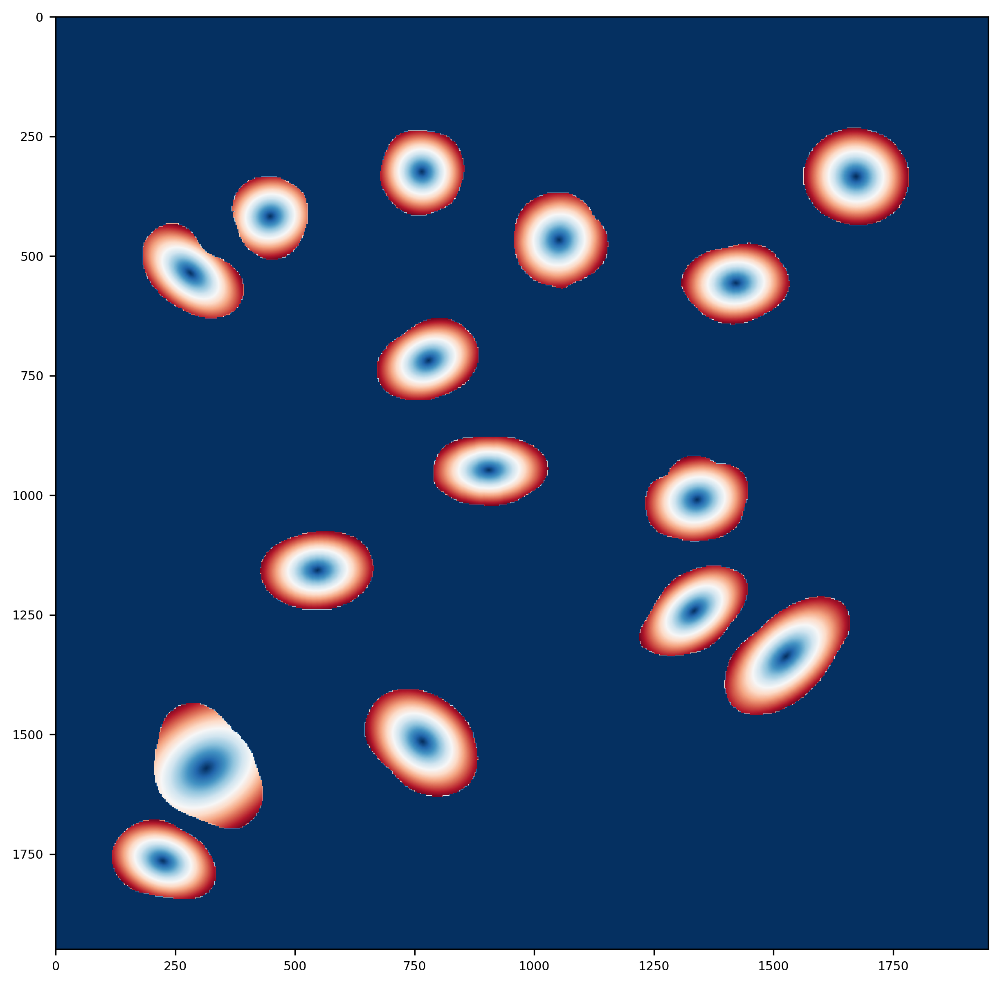

In [32]:
spot_adata.layers['img_digital'] = np.zeros_like(spot_adata.layers['batch0_nucleus_shape'])

for cell_n in np.unique(spot_adata.layers['batch0_nucleus_shape']):
    if cell_n==0:
        continue
    spot_adata.layers['tmp_img'] = spot_adata.layers['batch0_nucleus_shape'].copy()
    spot_adata.layers['tmp_img'][spot_adata.layers['tmp_img']!=cell_n] = 0
    st.cs.utils.get_cell_shape(spot_adata, layer="tmp_img", thickness=1)
    
    aa = np.array(np.where(spot_adata.layers['tmp_img_boundary'] == 255)).T

    import os
    os.environ['R_HOME'] = '/usr/lib/R'

    from rpy2.robjects.packages import importr
    from rpy2 import robjects
    fitEC = importr("fitEC")

    import rpy2.robjects.numpy2ri
    rpy2.robjects.numpy2ri.activate()

    X = aa
    efit = fitEC.fit_ellipse(X)

    a = efit[2][0]
    b = efit[3][0]
    c = np.sqrt(a**2 - b**2)

    f1_dis = np.zeros_like(spot_adata.layers['tmp_img_boundary'])
    f1_dis[:] = 1

    x1= int(efit[1][0]-a*np.sin(efit[4][0]))
    y1= int(efit[1][1]+a*np.cos(efit[4][0]))

    x2= int(efit[1][0]+a*np.sin(efit[4][0]))
    y2= int(efit[1][1]-a*np.cos(efit[4][0]))
    f1_dis = cv2.line(f1_dis,(y1,x1), (y2,x2), (0),1)
    f1_dis = cv2.distanceTransform(f1_dis,cv2.DIST_L2,cv2.DIST_MASK_PRECISE)

    f1_dis = f1_dis / b * a

    f2_dis = np.zeros_like(spot_adata.layers['tmp_img_boundary'])
    f2_dis[:] = 1

    x1= int(efit[1][0]-a*np.cos(efit[4][0]))
    y1= int(efit[1][1]-a*np.sin(efit[4][0]))

    x2= int(efit[1][0]+a*np.cos(efit[4][0]))
    y2= int(efit[1][1]+a*np.sin(efit[4][0]))
    f2_dis = cv2.line(f2_dis,(y1,x1), (y2,x2), (0),1)
    f2_dis = cv2.distanceTransform(f2_dis,cv2.DIST_L2,cv2.DIST_MASK_PRECISE)

    digi_field = np.sqrt(f1_dis**2+f2_dis**2) - np.min(np.sqrt(f1_dis**2+f2_dis**2))

    spot_adata.layers['tmp_img_digital'] = np.where(spot_adata.layers['tmp_img']!=0, digi_field, 0)

    spot_adata.layers['tmp_img_digital'] = spot_adata.layers['tmp_img_digital'] / np.max(spot_adata.layers['tmp_img_digital']) * 100


    #plt.figure(figsize=(30,30))
    #plt.imshow(spot_adata.layers['tmp_img_digital'], cmap="Reds")
    
    spot_adata.layers['img_digital'] = spot_adata.layers['img_digital'] + spot_adata.layers['tmp_img_digital']

    
plt.figure(figsize=(10,10))
plt.imshow(spot_adata.layers['img_digital'], cmap="RdBu_r")

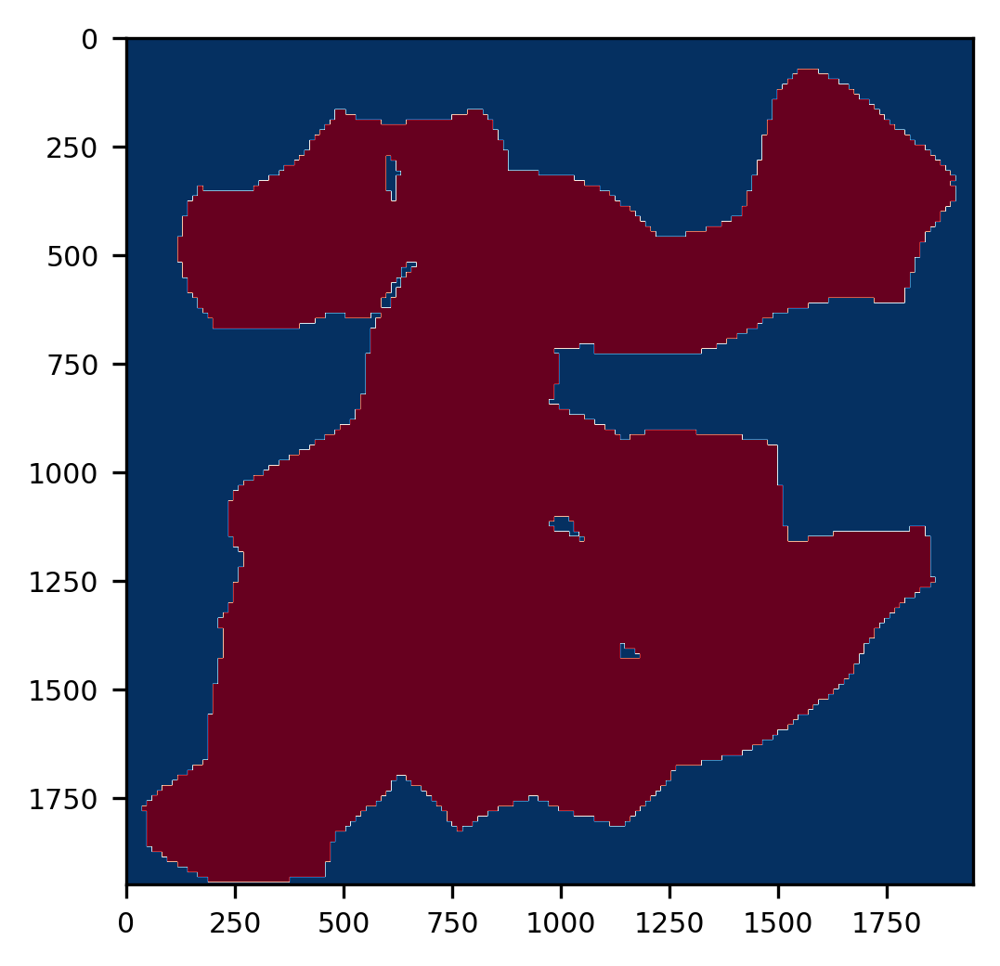

In [35]:
dilate_kernel = np.ones((3, 3), np.uint8)
spot_adata.layers['batch0_cell_shape_boundary_dilate'] = cv2.dilate(spot_adata.layers['batch0_cell_shape'], dilate_kernel, iterations=1)

plt.imshow(np.where(spot_adata.layers['batch0_cell_shape']!=0,50,spot_adata.layers['img_digital']), cmap="RdBu_r")

In [36]:
df = generate_long_matrix_df(adata, 0)
df

,x,y,gene,cell,nucleus,batch,x_int,y_int,count
4,1541.75090,124.650345,AKAP11,11-0,-1,0,1541,124,1
5,1526.97580,248.519300,AKAP11,11-0,-1,0,1526,248,1
6,1739.53400,363.478000,AKAP11,11-0,3,0,1739,363,1
7,1420.07250,542.724060,AKAP11,16-0,7,0,1420,542,1
8,1452.24240,563.947270,AKAP11,16-0,7,0,1452,563,1
...,...,...,...,...,...,...,...,...,...
199559,1713.29130,452.321000,RAB3B,11-0,-1,0,1713,452,1
199560,1036.16380,1056.410200,KIAA1147,21-0,-1,0,1036,1056,1
199561,656.27264,968.025450,UMPS,21-0,-1,0,656,968,1
199562,1699.85640,498.924300,GPR107,11-0,-1,0,1699,498,1


In [37]:
digital_layer = spot_adata.layers['img_digital'].astype(np.int32)

In [38]:
vars = []
for gene in np.unique(df['gene']):
    vars.append(reg_one_gene(df, spot_adata, digital_layer, gene))

var_df = pd.DataFrame({'var': vars, 'gene': np.unique(df['gene'])})

In [39]:
digital_6_gene_dfs = []
for gene in var_df.sort_values(by='var', ascending=False).head(3)['gene']:
    digital_6_gene_dfs.append(get_digital_info_for_one_gene(df, spot_adata, digital_layer, gene))
for gene in var_df.sort_values(by='var', ascending=False).tail(3)['gene']:
    digital_6_gene_dfs.append(get_digital_info_for_one_gene(df, spot_adata, digital_layer, gene))
digital_6_gene_df = pd.concat(digital_6_gene_dfs, ignore_index=True)

digital_6_gene_df

,digital_layer,cell_ids,expression,gene
0,1,1.0,0.001145,SRRM2
1,1,2.0,0.049069,SRRM2
2,1,3.0,0.014177,SRRM2
3,1,4.0,0.013183,SRRM2
4,1,5.0,0.005540,SRRM2
...,...,...,...,...
893,10,11.0,0.000000,DSEL
894,10,13.0,0.000000,DSEL
895,10,15.0,0.000000,DSEL
896,10,16.0,0.000000,DSEL


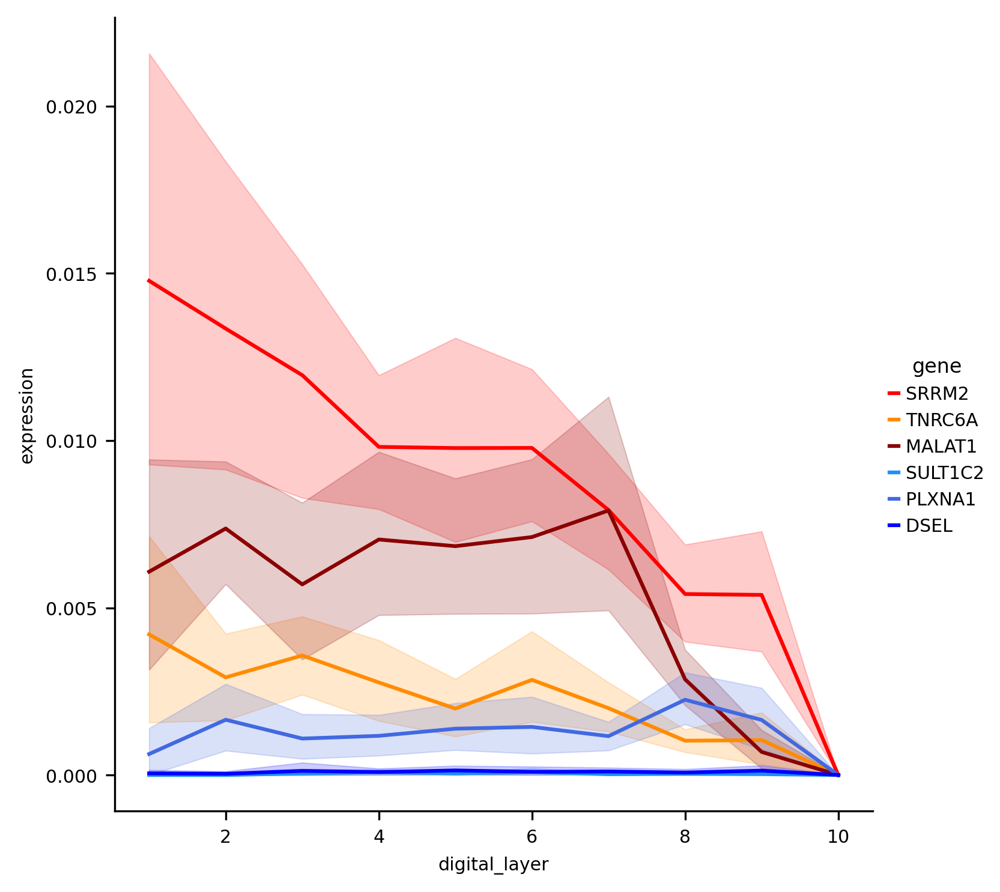

In [40]:
sns.relplot(data=digital_6_gene_df, x='digital_layer', y='expression', kind="line", hue='gene', palette=['red', 'darkorange', 'darkred', 'dodgerblue', 'royalblue', 'blue'])

### Figure S5e-h- Digitization benchmark on the MERFISH mouse cortex sample

In [41]:
one_slice_adata = st.read_h5ad("/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_digitization_materials/one_slice_dig.h5ad")
one_slice_adata

AnnData object with n_obs × n_vars = 2226 × 254
    obs: 'class_label', 'subclass', 'label', 'cluster_img_label', 'digital_layer', 'digital_column'
    uns: '__type', 'subclass_colors'
    obsm: 'X_spatial', 'spatial', 'spatial_bin30'

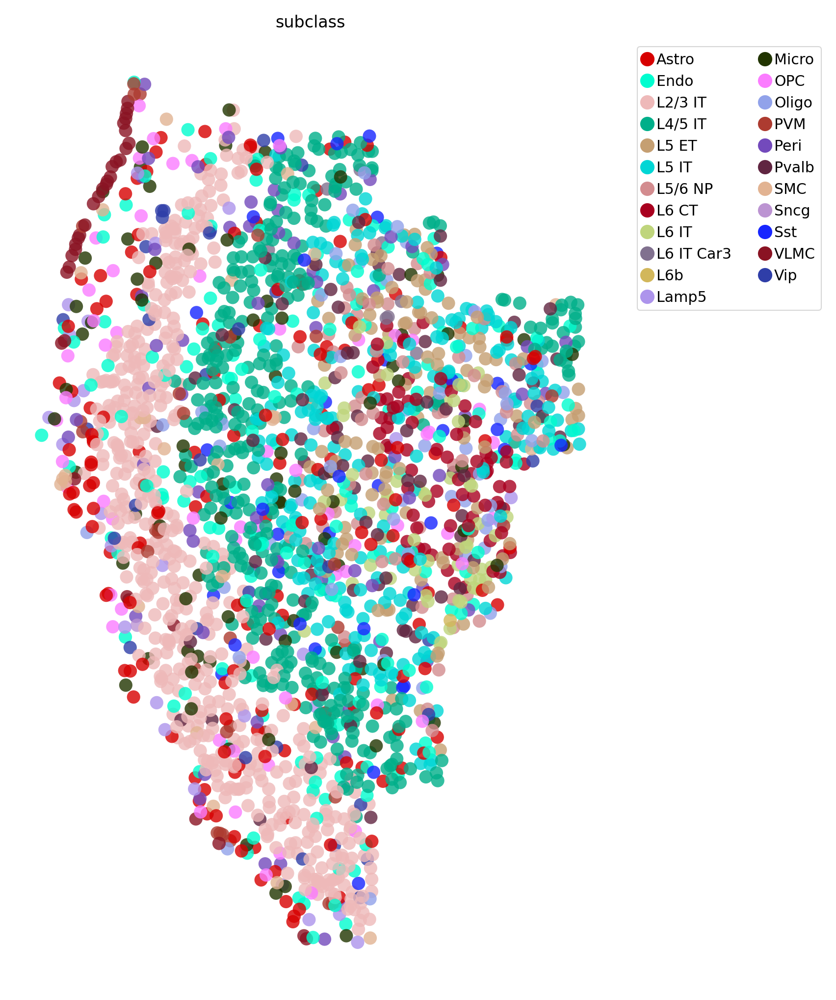

In [42]:
st.pl.space(adata=one_slice_adata, color='subclass', pointsize=0.5, show_legend="upper left")

#### Spateo digitization

In [43]:
one_slice_adata.obsm['spatial_bin30'] = one_slice_adata.obsm['spatial']//30
cluster_label_image_lowres = st.dd.gen_cluster_image(one_slice_adata, bin_size=1, spatial_key="spatial_bin30", cluster_key='class_label', show=False)
cluster_label_list = np.unique(one_slice_adata[one_slice_adata.obs['class_label'].isin(['Glutamatergic','GABAergic', 'Other']), :].obs["cluster_img_label"])
contours, cluster_image_close, cluster_image_contour = st.dd.extract_cluster_contours(cluster_label_image_lowres, cluster_label_list, bin_size=1, k_size=6, show=False)
px.imshow(cluster_image_contour, width=500, height=500)

|-----> Set up the color for the clusters with the tab20 colormap.
|-----> Saving integer labels for clusters into adata.obs['cluster_img_label'].
|-----> Prepare a mask image and assign each pixel to the corresponding cluster id.
|-----> Get selected areas with label id(s): [1 2 3].
|-----> Close morphology of the area formed by cluster [1 2 3].
|-----> Remove small region(s).
|-----> Extract contours.


In [44]:
# User input to specify a gridding direction
pnt_xY = (41,133)
pnt_xy = (0,107)
pnt_Xy = (70,91)
pnt_XY = (53,133)

# Digitize the area of interest
st.dd.digitize(
    adata=one_slice_adata,
    ctrs=contours,
    ctr_idx=0,
    pnt_xy=pnt_xy,
    pnt_xY=pnt_xY,
    pnt_Xy=pnt_Xy,
    pnt_XY=pnt_XY,
    spatial_key="spatial_bin30"
)

|-----> Initialize the field of the spatial domain of interests.
|-----> Prepare the isoline segments with either the highest/lower column or layer heat values.
|-----> Solve the layer heat equation on spatial domain with the iso-layer-line conditions.
|-----> Total iteration: 1990
|-----> Saving layer heat values to digital_layer.
index
100023173600007776283900355785793185282    0.0
100357557613983092542421396030726393144    0.0
100438314633131300286240527528820911794    0.0
100689500727523367948135048603789232105    0.0
100756095765922513431551474967095417597    0.0
                                          ... 
99504315822769332707657734242098006499     0.0
99528441087021422178130959987912527700     0.0
99593704095452349910253168565130697406     0.0
99960447258132021953935293181727472742     0.0
99962729114062153927784338888318171597     0.0
Name: digital_layer, Length: 2226, dtype: float64
|-----> Solve the column heat equation on spatial domain with the iso-column-line conditions.

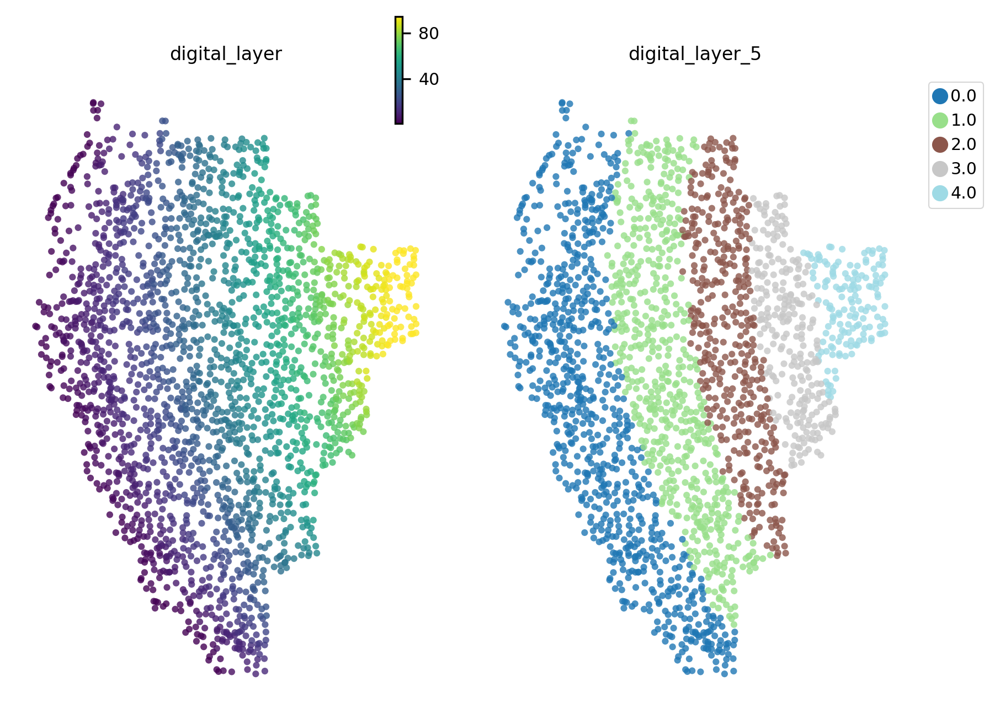

In [45]:
# Visualize digitized layers and columns
one_slice_adata.obs['digital_layer_5'] = (one_slice_adata.obs['digital_layer']-1)//20
one_slice_adata.obs['digital_layer_5'] = one_slice_adata.obs['digital_layer_5'].astype(str)

st.pl.space(
    one_slice_adata[one_slice_adata.obs['digital_layer']!=0],
    color=['digital_layer','digital_layer_5'],
    ncols=2,
    pointsize=0.1,
    show_legend="upper left",
    color_key_cmap="tab20",
    figsize=(4, 5),
)

#### Belayer digitization

In [46]:
import networkx as nx
from slideseq_helpers import alpha_shape, harmonic_slideseq

In [47]:
coords = one_slice_adata.obsm['spatial']

edges = list(alpha_shape(coords, alpha=100, only_outer=True))
G = nx.DiGraph(edges)

edge_pts=list(nx.simple_cycles(G))[0]
edge_pts=[(coords[e,0],coords[e,1]) for e in edge_pts]

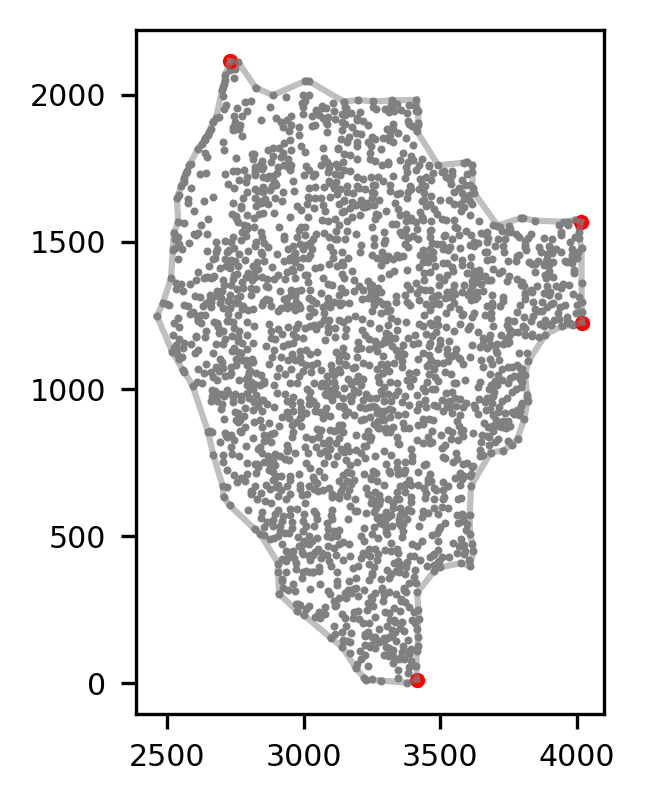

In [48]:
fig, ax = plt.subplots(figsize=(2,3))
for i, j in edges:
    plt.plot(coords[[i, j], 0], coords[[i, j], 1], color='grey', ls='-',alpha=0.5)

plt.scatter(coords[:,0],coords[:,1],s=2,color='grey')

x, y = edge_pts[48]
plt.scatter(x, y, s=10, color='red')

x, y = edge_pts[94]
plt.scatter(x, y, s=10, color='red')

x, y = edge_pts[20]
plt.scatter(x, y, s=10, color='red')

x, y = edge_pts[13]
plt.scatter(x, y, s=10, color='red')

In [49]:
boundary_array = []
boundary_array.append(np.array([[i[0], i[1]] for i in edge_pts[48:94+1]]))
boundary_array.append(np.array([[i[0], i[1]] for i in edge_pts[13:20+1]]))
one_slice_adata.obs['belayer'] = harmonic_slideseq(coords, boundary_array, grid_spacing=20, radius=10)

starting harmonic interpolation...


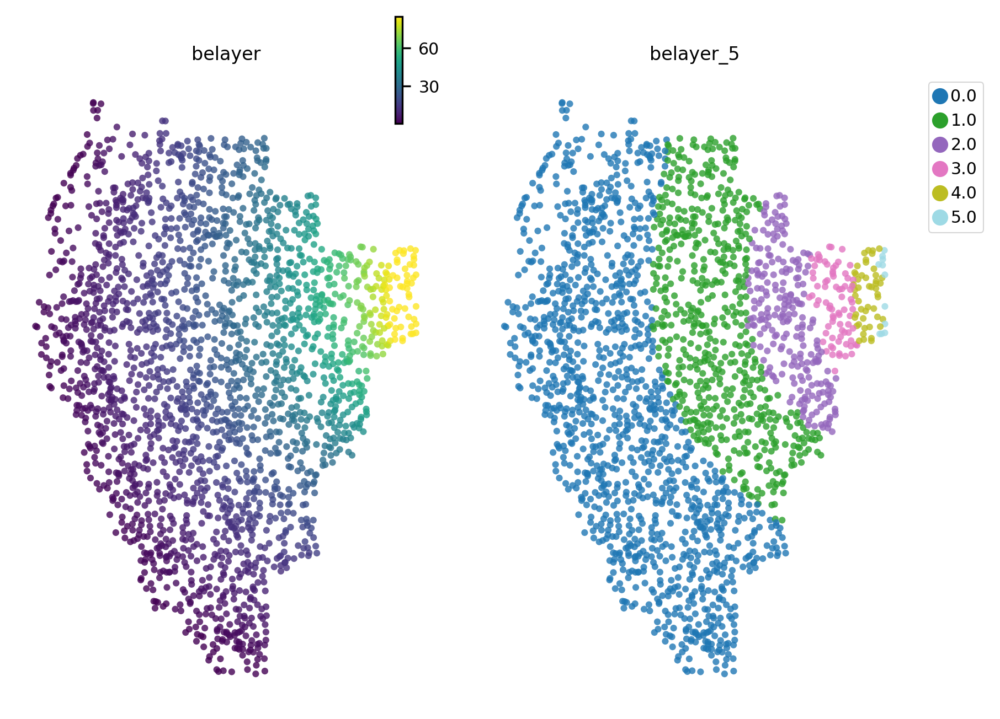

In [50]:
# Visualize digitized layers and columns
one_slice_adata.obs['belayer_5'] = (one_slice_adata.obs['belayer'])//20
one_slice_adata.obs['belayer_5'] = one_slice_adata.obs['belayer_5'].astype(str)

st.pl.space(
    one_slice_adata[one_slice_adata.obs['digital_layer']!=0],
    color=['belayer','belayer_5'],
    ncols=2,
    pointsize=0.1,
    show_legend="upper left",
    color_key_cmap="tab20",
    figsize=(4, 5),
)

#### Distribution of layer-enriched cell types

In [51]:
df = one_slice_adata.obs[['subclass', 'digital_layer', 'belayer']]
df = df[df['subclass'].isin(['L2/3 IT', 'L4/5 IT', 'L5 IT', 'L6 IT'])]
df['subclass'] = df['subclass'].astype('str').astype('category')

<AxesSubplot: xlabel='digital_layer', ylabel='Density'>

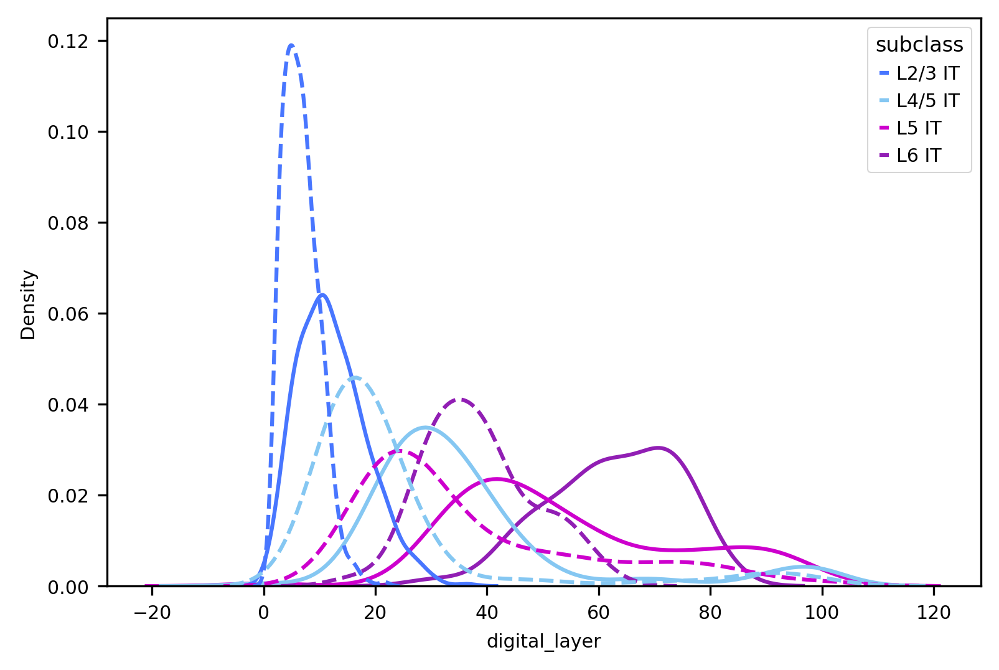

In [52]:
sns.kdeplot(data=df, x='digital_layer', hue='subclass', common_norm=False)
sns.kdeplot(data=df, x='belayer', hue='subclass', common_norm=False, linestyle="--")

<AxesSubplot: xlabel='digital_layer', ylabel='belayer'>

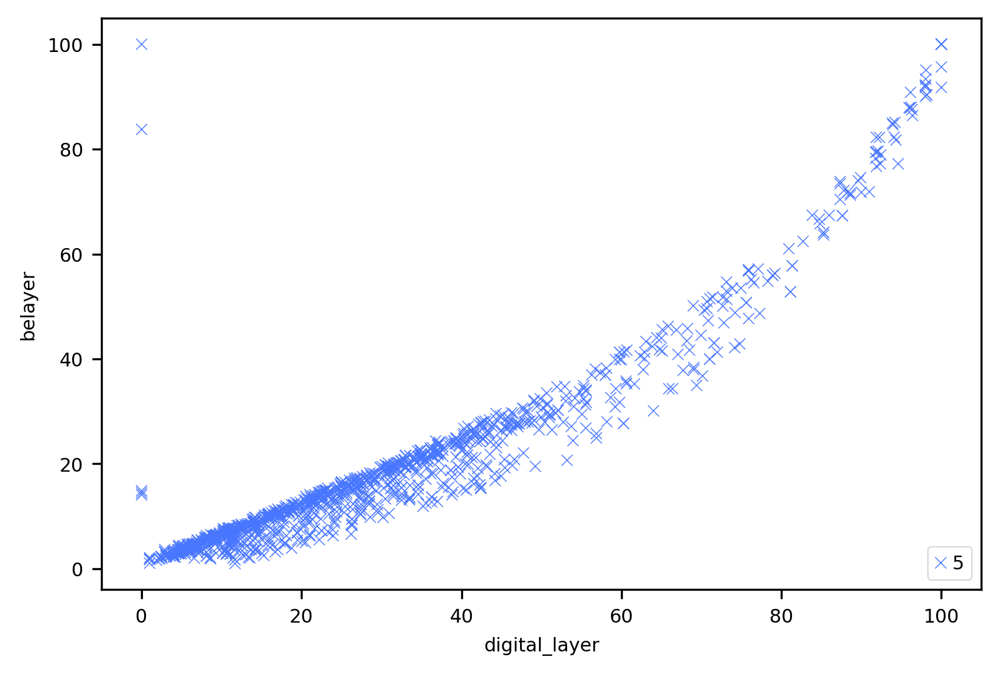

In [53]:
sns.scatterplot(data=df, x='digital_layer', y='belayer', size=5, marker='x')

In [54]:
if os.path.exists("tmp.csv"):
    os.remove("tmp.csv")

# CCI

In [ ]:
np.random.seed(888)

In [ ]:
%config InlineBackend.print_figure_kwargs={'dpi': 300.0}

In [ ]:
# For viewability purposes, process all "COL" elements to "Collagens": 
def replace_col_with_collagens(string):
    parts = string.split(':')
    elements = parts[0].split('/')
    
    # Flag to check if we've encountered a "COL" element or a "Collagens" element
    encountered_col = False
    
    for i, element in enumerate(elements):
        # If the element starts with "COL" or "b_COL", or if it is "Collagens" or "b_Collagens"
        if element.startswith("COL") or element.startswith("b_COL") or element in ["Collagens", "b_Collagens"]:
            # If we've already encountered a "COL" or "Collagens" element, remove this one
            if encountered_col:
                elements[i] = None
            # Otherwise, replace it with "Collagens" or "b_Collagens" as appropriate
            else:
                if element.startswith("b_COL") or element == "b_Collagens":
                    elements[i] = "b_Collagens"
                else:
                    elements[i] = "Collagens"
                encountered_col = True
                
    # Remove None elements and join the rest with slashes
    replaced_part = '/'.join([element for element in elements if element is not None])
    
    # If there's a second part, add it back
    if len(parts) > 1:
        replaced_string = replaced_part + ':' + parts[1]
    else:
        replaced_string = replaced_part
        
    return replaced_string

## Resources used for the CosMx sample can be found: https://www.dropbox.com/scl/fo/z3bvppoq96vg442lma0rs/ACIXLqp-FXjuYQ2ZeAeHFEA?rlkey=84h21aoigdxrpfz9yrbsyepwg&st=55ozincu&dl=0
## Resources used for the MERFISH sample can be found: https://www.dropbox.com/scl/fo/s7mjpdgbk4f2mj1rndooo/AAkL3b4W3JazjGDn3pSKKrk?rlkey=3acd5da9bcl743x0byrrm8jxp&st=9g9b9o47&dl=0 
## Database files used here can be found: https://www.dropbox.com/scl/fo/dcd95so9zhkb8lnjkkxep/ANwmkFeb-sgtS89leHQezlU?rlkey=saiul4j5rr1vt6lwjl4hirmwh&st=brpjqw2c&dl=0

### Make sure to change each file path to the relevant local folder

In [55]:
# Set the Spateo database directory here:
database_dir = "/home/danielyumengzhu/spateo-release/spateo/tools/database"

## Load MERFISH brain sample FOVs

In [56]:
# Two FOVs are included- use this to change which is selected (options are 153 or 162)
fov_number = 153

In [57]:
# Replace with wherever this file is stored locally
path_to_merfish = f"/home/danielyumengzhu/Single-cell-data/MERFISH_mouse_brain/MERFISH_mouse_brain_mouse1_fov{fov_number}.h5ad"
# Replace with wherever the L:R database is stored locally
lr_db = pd.read_csv("/home/danielyumengzhu/spateo-release/spateo/tools/database/lr_db_mouse.csv", index_col=0)

In [59]:
merfish_fov = anndata.read_h5ad(path_to_merfish)
merfish_fov.uns["__type"] = "UMI"

### Figure S5l- spatially-resolved cell types plot

In [60]:
spatial_coords = merfish_fov.obsm['spatial']
x_coords = spatial_coords[:, 0]
y_coords = spatial_coords[:, 1]
cell_types = merfish_fov.obs['general_cell_type']

In [61]:
unique_cell_types = np.unique(cell_types)
color_map = {
    'Astro': '#d70000',
    'Endo': '#00fdcf',
    'L23_IT': '#eeb9b9',
    'L45_IT': '#00af8a',
    'L56_NP': '#d38c8f',
    'L5_ET': '#c59f72',
    'L5_IT': '#00d6d5',
    'L6_CT': '#a9001f',
    'L6_IT': '#bfd57c',
    'L45_IT_SSp': '#f46200',
    'L6b': '#d2b75b',
    'Lamp5': '#ad94ec',
    'Micro': '#213400',
    'OPC': '#fb7cff',
    'Oligo': '#91a2ea',
    'PVM': '#ad3b30',
    'Peri': '#734abc',
    'Pvalb': '#602541',
    'SMC': '#e2b392',
    'Sncg': '#bc94d2',
    'Sst': '#1726ff',
    'VLMC': '#8a1323',
    'Vip': '#2f3ea8',
    'striatum': '#ffa500'
}

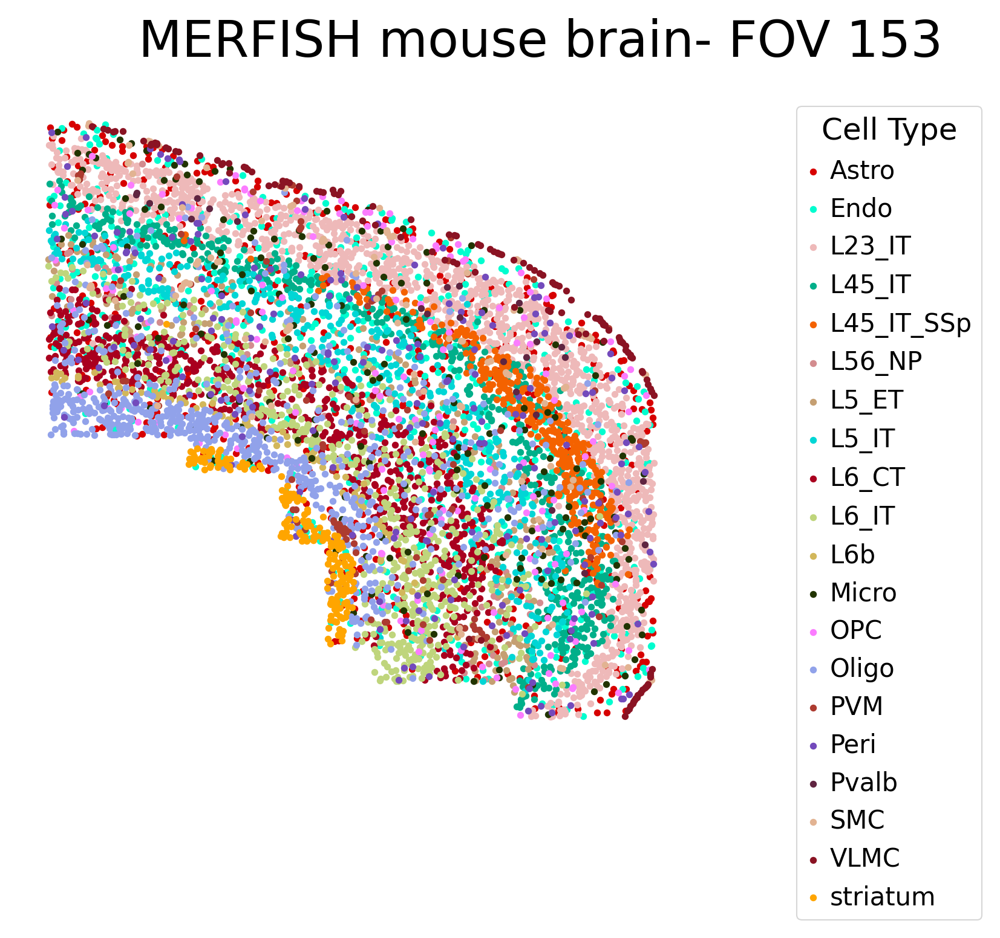

In [62]:
# Scatter plot
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16

fig, axes = plt.subplots(1, 1, figsize=(6, 5))
fig.suptitle(f'MERFISH mouse brain- FOV {fov_number}', fontsize=20)
    
for cell_type in unique_cell_types:
    idx = cell_types == cell_type
    axes.scatter(x_coords[idx], y_coords[idx], color=color_map[cell_type], label=cell_type, s=5)

axes.set_ylim(axes.get_ylim())  # Sync y-limits with the scatter plot
# Remove plot borders
for spine in axes.spines.values():
    spine.set_visible(False)

# Remove tick marks and labels
axes.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
axes.legend(title='Cell Type', bbox_to_anchor=(1.15, 1), loc='upper left', title_fontsize='12', fontsize='10')

plt.tight_layout(rect=[0, 0, 0.95, 1])  # Adjust the layout to fit everything nicely
plt.show()

In [66]:
# Set to the folders that the inputs (only the targets list for this data) are contained in and that the outputs (model results) will save to:
cci_input_directory = "/home/danielyumengzhu/Single-cell-data/MERFISH_mouse_brain"
cci_output_directory = f"/home/danielyumengzhu/Single-cell-analysis/MERFISH_mouse-brain/slice{fov_number}"
cci_output_id = os.path.join(cci_output_directory, f"slice{fov_number}.csv")
cci_targets_file = os.path.join(cci_input_directory, f"target_genes_fov{fov_number}.txt")

#### Initialize and run CCI model (can skip if predictions .csv file was created locally or downloaded from the folder)

In [ ]:
if fov_number == 153:
    lb = 50.0
    ub = 139.6
else:
    lb = 48.9
    ub = 136.4

In [ ]:
# For clarity, this is how the distance bounds are determined
lb = st.tl.find_neighbors.find_bw_for_n_neighbors(
    merfish_fov,
    coords_key="spatial",
    n_anchors=2000,
    target_n_neighbors=9,
    initial_bw=200,
    exclude_self=True
)

In [ ]:
ub = st.tl.find_neighbors.find_bw_for_n_neighbors(
    merfish_fov,
    coords_key="spatial",
    n_anchors=2000,
    target_n_neighbors=70,
    initial_bw=200,
    exclude_self=True
)

In [ ]:
adata_path = path_to_cosmx
output_path = cci_output_id
target_path = cci_targets_file
cci_dir_path = database_dir
mod_type = "niche"
distr = "poisson"
species = "mouse"
group_key = "general_cell_type"
coords_key = "spatial"
distance_membrane_bound = lb
distance_secreted = ub
minbw = lb
maxbw = ub * 1.5

if not os.path.exists(os.path.dirname(output_path)):
    os.makedirs(os.path.dirname(output_path))

In [ ]:
parser, args_list = st.tl.define_spateo_argparse(
    adata_path=adata_path,
    targets_path=target_path,
    cci_dir=cci_dir_path,
    mod_type=mod_type,
    distr=distr,
    species=species,
    group_key=group_key,
    coords_key=coords_key,
    distance_membrane_bound=distance_membrane_bound,
    distance_secreted=distance_secreted,
    minbw=minbw,
    maxbw=maxbw,
    output_path=output_path,
)

In [ ]:
import time

t1 = time.time()

swr_model = st.tl.MuSIC(parser, args_list)
swr_model._set_up_model()
swr_model.fit()
swr_model.predict_and_save()

t_last = time.time()

print("Total Time Elapsed:", np.round(t_last - t1, 2), "seconds")
print("-" * 60)

In [ ]:
# Note that the predictions.csv file is also provided in the Dropbox

#### Run NCEM model for the comparison (can also skip to the next section- the predictions file is included in the Dropbox folder)

In [ ]:
# These are the contents of the "target_genes" txt files, spelled out in the form of a list
if sample_id == 153:
    target_genes = ["Flt1", "Aqp4", "Parm1", "Rorb", "Syt6", "Calb1", "Prdm8", "Rspo1", "Lypd1", "Adamts4", "Vtn", "Lamp5"]
else:
    target_genes = ["Flt1", "Aqp4", "Parm1", "Rorb", "Syt6", "Calb1", "Prdm8", "Rspo1", "Ptpru", "Adamts4", "Vtn", "Lamp5"]

In [ ]:
# 6779 is prime, need to randomly drop 1 cell for NCEM- this is saved as a separate file in the MERFISH dropbox
# Replace the file path with wherever this file is stored locally
mouse_brain_ncem = anndata.read_h5ad(f"/home/danielyumengzhu/Single-cell-data/MERFISH_mouse_brain/MERFISH_mouse_brain_mouse1_fov{fov_number}_NCEM_processed.h5ad")

In [ ]:
# Requirement for initializing interpreter
mouse_brain_ncem.uns["spatial"] = "Hello, world"

In [ ]:
# Use the upper distance bound as the distance parameter for NCEM
dist = ub

In [ ]:
interpreter = ncem.interpretation.interpreter.InterpreterInteraction()

In [ ]:
interpreter.data = customLoader(
    adata=mouse_brain_ncem, cluster='general_cell_type', patient='Batch', library_id='Batch', radius=dist,
)
get_data_custom(interpreter=interpreter)

In [ ]:
interpreter.n_eval_nodes_per_graph = 2

In [ ]:
interpreter.get_sender_receiver_effects()

In [ ]:
# Backsolve to get the design matrix:
img_keys = interpreter.img_keys_all
nodes_idx = interpreter.nodes_idx_all

In [ ]:
(target, interactions, _, _, _), y = interpreter._get_np_data(image_keys=img_keys, nodes_idx=nodes_idx)
x_design = np.concatenate([target, interactions], axis=1)
x_design

In [ ]:
def ols_fit(x_, y_):
    """beta = (XT * X)^-1 XT y"""
    X = np.matmul(
        np.linalg.pinv(np.matmul(x_.T, x_)),
        x_.T
    )
    return np.array([
        np.matmul(
            X, y_[:, [i]]
        )
        for i in range(y_.shape[1])
    ])

ols = ols_fit(x_=x_design, y_=y)
params = ols.squeeze()

params.shape

In [ ]:
reconst = np.matmul(x_design, params.T)
reconst

In [ ]:
reconst_df = pd.DataFrame(reconst, index=mouse_brain_ncem.obs_names, columns=target_genes)

In [ ]:
# Change to an appropriate location on the local system
save_path = f"/home/danielyumengzhu/Single-cell-analysis/MERFISH_mouse-brain/NCEM_predictions_fov{fov_number}.csv"
reconst_df.to_csv(save_path)

### Figure S5m- barplots comparing performance of Spateo vs. NCEM

In [63]:
# Change to the location on the local system where the NCEM predictions were saved
ncem_save_path = f"/home/danielyumengzhu/Single-cell-analysis/MERFISH_mouse-brain/NCEM_predictions_fov{fov_number}.csv"
ncem_reconst_df = pd.read_csv(ncem_save_path, index_col=0)

In [67]:
spateo_save_path = os.path.join(cci_output_directory, "predictions.csv")
spateo_reconst_df = pd.read_csv(spateo_save_path, index_col=0)

In [70]:
# In case the previous section was skipped over
if fov_number == 153:
    target_genes = ["Flt1", "Aqp4", "Parm1", "Rorb", "Syt6", "Calb1", "Prdm8", "Rspo1", "Lypd1", "Adamts4", "Vtn", "Lamp5"]
else:
    target_genes = ["Flt1", "Aqp4", "Parm1", "Rorb", "Syt6", "Calb1", "Prdm8", "Rspo1", "Ptpru", "Adamts4", "Vtn", "Lamp5"]

# 6779 is prime, need to randomly drop 1 cell for NCEM- this is saved as a separate file in the MERFISH dropbox
# Replace the file path with wherever this file is stored locally
mouse_brain_ncem = anndata.read_h5ad(f"/home/danielyumengzhu/Single-cell-data/MERFISH_mouse_brain/MERFISH_mouse_brain_mouse1_fov{fov_number}_NCEM_processed.h5ad")

#### Bootstrap resampling- can skip over this section as well if these files have already been generated or the result files were downloaded from the resource folder

In [71]:
# Note that for the figure, only the R-squared comparison is included, but this computes additional metrics that can also be compared w/ modifications to code below:
def compute_metrics(y_true, y_pred):
    metrics = {}
    
    rp, _ = pearsonr(y_true, y_pred)
    r, _ = spearmanr(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)

    binary_y_true = (y_true != 0).astype(int)
    binary_y_pred = (y_pred != 0).astype(int)
    intersection = np.sum(binary_y_true * binary_y_pred)
    union = np.sum(np.maximum(binary_y_true, binary_y_pred))
    ji = intersection / union if union != 0 else 1.0

    metrics['Pearson r'] = rp
    metrics['Spearman r'] = r
    metrics['R-squared'] = r2
    metrics['RMSE'] = rmse
    metrics['Jaccard index'] = ji

    return metrics

In [72]:
np.random.seed(888)

In [73]:
# Define the number of bootstrap samples
n_bootstrap_samples = 1000
n_samples_to_pick = 200
confidence_level = 0.95

# Initialize empty DataFrames
total_rs_df = pd.DataFrame()
bootstrap_df = pd.DataFrame()  # To store all bootstrap results

In [ ]:
# Bootstrap for the Spateo results
for i, gene in tqdm(enumerate(all_genes), desc="Computing metrics for all genes..."):
    y = merfish_fov[:, gene].X.toarray().reshape(-1)
    spateo_results_target = spateo_reconst_df[gene].values.reshape(-1)

    non_zero_indices = np.nonzero(y)[0]
    y_non_zero = y[non_zero_indices]
    spateo_results_target_non_zero = spateo_results_target[non_zero_indices]
    
    if np.isnan(y).any() or np.isnan(spateo_results_target).any():
        print(f"Array contains NaN values for gene {gene}")
        continue
    
    # Bootstrap resampling
    bootstrap_metrics = []
    for _ in range(n_bootstrap_samples):
        indices = np.random.choice(len(y_non_zero), size=n_samples_to_pick, replace=False)
        y_resampled = y_non_zero[indices]
        spateo_results_resampled = spateo_results_target_non_zero[indices]
        metrics = compute_metrics(y_resampled, spateo_results_resampled)
        bootstrap_metrics.append(metrics)
    
    # Convert bootstrap metrics to DataFrame
    spateo_bootstrap_df = pd.DataFrame(bootstrap_metrics)
    spateo_bootstrap_df.columns = [f"Spateo {col} {gene}" for col in spateo_bootstrap_df.columns]
    bootstrap_df = pd.concat([bootstrap_df, spateo_bootstrap_df], axis=1)
    
    # Compute confidence intervals
    ci_lower = spateo_bootstrap_df.quantile((1 - confidence_level) / 2)
    ci_upper = spateo_bootstrap_df.quantile(1 - (1 - confidence_level) / 2)

    # Original metrics for the gene
    original_metrics = compute_metrics(y_non_zero, spateo_results_target_non_zero)
    
    # Append metric and confidence intervals to DataFrame
    new_rs = pd.DataFrame([{'Gene names': gene, 'Model type': "Spateo", 'R-squared': original_metrics['R-squared'],
                            'CI Lower': ci_lower[f'Spateo R-squared {gene}'], 'CI Upper': ci_upper[f'Spateo R-squared {gene}']}])
    total_rs_df = pd.concat([total_rs_df, new_rs])

In [ ]:
# Bootstrap for the NCEM results
for i, gene in tqdm(enumerate(all_genes), desc="Computing NCEM metrics for all genes..."):
    y = mouse_brain_ncem[:, gene].X.toarray().reshape(-1)
    NCEM_results_target = ncem_reconst_df[gene].values.reshape(-1)

    non_zero_indices = np.nonzero(y)[0]
    y_non_zero = y[non_zero_indices]
    NCEM_results_target_non_zero = NCEM_results_target[non_zero_indices]
    
    if np.isnan(y).any() or np.isnan(NCEM_results_target).any():
        print(f"Array contains NaN values for gene {gene}")
        continue
    
    # Bootstrap resampling
    bootstrap_metrics = []
    for _ in range(n_bootstrap_samples):
        indices = np.random.choice(len(y_non_zero), size=n_samples_to_pick, replace=False)
        y_resampled = y_non_zero[indices]
        NCEM_resampled = NCEM_results_target_non_zero[indices]
        metrics = compute_metrics(y_resampled, NCEM_resampled)
        bootstrap_metrics.append(metrics)
    
    # Convert bootstrap metrics to DataFrame
    ncem_bootstrap_df = pd.DataFrame(bootstrap_metrics)
    ncem_bootstrap_df.columns = [f"NCEM {col} {gene}" for col in ncem_bootstrap_df.columns]
    bootstrap_df = pd.concat([bootstrap_df, ncem_bootstrap_df], axis=1)
    
    # Compute confidence intervals
    ci_lower = ncem_bootstrap_df.quantile((1 - confidence_level) / 2)
    ci_upper = ncem_bootstrap_df.quantile(1 - (1 - confidence_level) / 2)

    # Original metrics for the gene
    original_metrics = compute_metrics(y_non_zero, NCEM_results_target_non_zero)
    
    # Append metrics and confidence intervals to DataFrames
    new_rs = pd.DataFrame([{'Gene names': gene, 'Model type': "NCEM", 'R-squared': original_metrics['R-squared'],
                            'CI Lower': ci_lower[f'NCEM R-squared {gene}'], 'CI Upper': ci_upper[f'NCEM R-squared {gene}']}])
    total_rs_df = pd.concat([total_rs_df, new_rs])

In [ ]:
# Change the path to an appropriate local directory
save_folder = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures"
total_rs_df.index = np.arange(len(total_rs_df))
total_rs_df.to_csv(os.path.join(save_folder, f"fov{fov_number}_benchmark_R-sq_results.csv"))

#### Barplot

In [74]:
def fisher_z_test_with_ci(r1, ci_lower1, ci_upper1, r2, ci_lower2, ci_upper2):
    z1 = 0.5 * np.log((1 + r1) / (1 - r1))
    z2 = 0.5 * np.log((1 + r2) / (1 - r2))
    var_z1 = ((ci_upper1 - ci_lower1) / (2 * 1.96)) ** 2
    var_z2 = ((ci_upper2 - ci_lower2) / (2 * 1.96)) ** 2
    z_diff = (z1 - z2) / np.sqrt(var_z1 + var_z2)
    p_value = 2 * (1 - norm.cdf(abs(z_diff)))
    return p_value

In [75]:
# Change the path to the directory these were saved to
save_folder = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures"
metric_results = pd.read_csv(os.path.join(save_folder, f"fov{fov_number}_benchmark_R-sq_results.csv"), index_col=0)

In [76]:
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

In [79]:
results = []

# Perform the test for each gene
for gene in metric_results["Gene names"].unique():
    spateo_row = metric_results[(metric_results["Gene names"] == gene) & (metric_results["Model type"] == "Spateo")].iloc[0]
    spateo_r = spateo_row["R-squared"]
    spateo_ci_lower = spateo_row["CI Lower"]
    spateo_ci_upper = spateo_row["CI Upper"]
    
    for index, row in metric_results[(metric_results["Gene names"] == gene) & (metric_results["Model type"] != "Spateo")].iterrows():
        model = row["Model type"]
        other_r = row["R-squared"]
        other_ci_lower = row["CI Lower"]
        other_ci_upper = row["CI Upper"]
        p_value = fisher_z_test_with_ci(spateo_r, spateo_ci_lower, spateo_ci_upper, other_r, other_ci_lower, other_ci_upper)
        results.append([gene, model, p_value])

# Convert results to a dataframe
results_df = pd.DataFrame(results, columns=["Gene", "Model", "p-value"])

# Adjust p-values for multiple comparisons using Benjamini-Hochberg correction
results_df["q-value"] = results_df["p-value"] * len(results_df) / (np.arange(1, len(results_df) + 1))
results_df

,Gene,Model,p-value,q-value
0,Flt1,NCEM,0.000000e+00,0.000000e+00
1,Aqp4,NCEM,4.676967e-08,2.806180e-07
2,Parm1,NCEM,1.052854e-04,4.211416e-04
3,Rorb,NCEM,2.501999e-06,7.505996e-06
4,Syt6,NCEM,6.886585e-10,1.652780e-09
5,Calb1,NCEM,7.131490e-01,1.426298e+00
6,Prdm8,NCEM,3.730639e-06,6.395381e-06
7,Rspo1,NCEM,3.943886e-07,5.915830e-07
8,Lypd1,NCEM,2.555337e-04,3.407116e-04
9,Adamts4,NCEM,7.944756e-13,9.533707e-13


In [ ]:
pastel_colors = sns.color_palette("pastel")
# Convert the colors to hex codes
colors_hex = [sns.color_palette("pastel").as_hex() for color in pastel_colors][0]
colors_hex[0], colors_hex[1] = colors_hex[1], colors_hex[0]

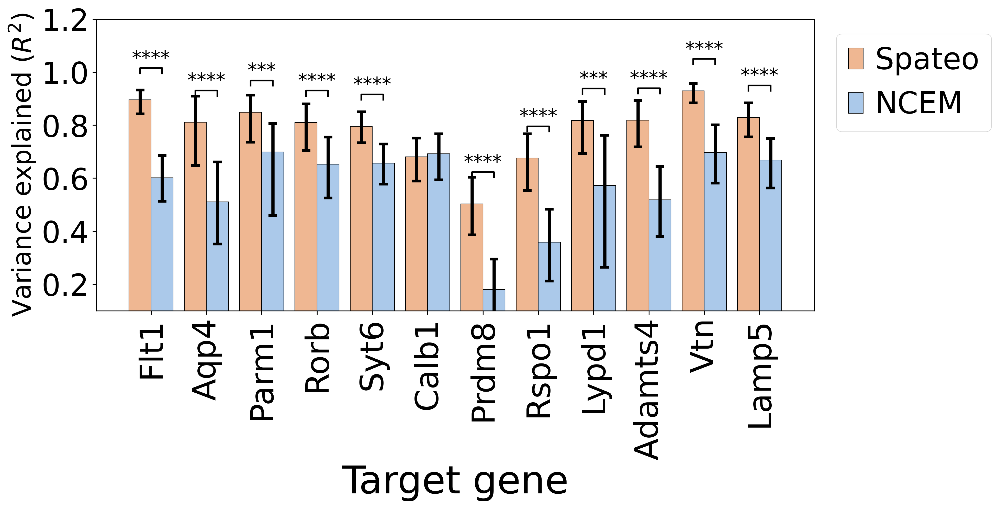

In [86]:
plt.figure(figsize=(12, 5))

# Use seaborn's barplot function with hue parameter for condition
ax = sns.barplot(data=metric_results, x="Gene names", y="R-squared", hue="Model type", palette=colors_hex, edgecolor='black', dodge=True, ci=None)

# Add error bars
bar_width = 0.8 / len(metric_results["Model type"].unique())  # Adjusting for the number of hue categories
for i, (gene, model) in enumerate(zip(metric_results["Gene names"], metric_results["Model type"])):
    y = metric_results[(metric_results["Gene names"] == gene) & (metric_results["Model type"] == model)]["R-squared"].values[0]
    ci_lower = metric_results[(metric_results["Gene names"] == gene) & (metric_results["Model type"] == model)]["CI Lower"].values[0]
    ci_upper = metric_results[(metric_results["Gene names"] == gene) & (metric_results["Model type"] == model)]["CI Upper"].values[0]
    
    # Calculate x position for each bar
    x = np.where(metric_results["Gene names"].unique() == gene)[0][0]
    x = x - bar_width / 2 * (len(metric_results["Model type"].unique()) - 1) + bar_width * list(metric_results["Model type"].unique()).index(model)
    
    # Plot the error bar
    ax.errorbar(x, y, yerr=[[y - ci_lower], [ci_upper - y]], fmt='none', c='black', elinewidth=3, capsize=4.0, capthick=2.5)

# Add significance annotations
# Initialize a dictionary to track the number of annotations for each gene
annotation_count = {gene: 0 for gene in metric_results["Gene names"].unique()}

for _, row in results_df.iterrows():
    gene = row["Gene"]
    model = row["Model"]
    p_value = row["p-value"]
    q_value = row["q-value"]

    # Determine the asterisk symbol based on q-value
    if q_value < 0.00005:
        symbol = "****"
    elif q_value < 0.0005:
        symbol = "***"
    elif q_value < 0.005:
        symbol = "**"
    elif q_value < 0.05:
        symbol = "*"
    else:
        continue  # Skip if not significant
    
    # Find the y-value for the annotation
    y = metric_results[(metric_results["Gene names"] == gene) & (metric_results["Model type"] == model)]["R-squared"].values[0]
    
    # Calculate x position for each bar
    x = np.where(metric_results["Gene names"].unique() == gene)[0][0]
    x = x - bar_width / 2 * (len(metric_results["Model type"].unique()) - 1) + bar_width * list(metric_results["Model type"].unique()).index(model)
    
    # Find the y-value for the Spateo model
    y_spateo = metric_results[(metric_results["Gene names"] == gene) & (metric_results["Model type"] == "Spateo")]["R-squared"].values[0]
    x_spateo = np.where(metric_results["Gene names"].unique() == gene)[0][0]
    x_spateo = x_spateo - bar_width / 2 * (len(metric_results["Model type"].unique()) - 1) + bar_width * list(metric_results["Model type"].unique()).index("Spateo")
    
    # Calculate the vertical position for the annotation
    annotation_offset = annotation_count[gene] * 0.15 + 0.1
    y_max = max(y, y_spateo) + annotation_offset
    
    # Plot the line between the Spateo bar and the other model bar
    ax.plot([x, x, x_spateo, x_spateo], [y_max, y_max + 0.02, y_max + 0.02, y_max], lw=1.5, c='black')
    
    # Add the asterisk annotation above the line
    ax.text((x + x_spateo) / 2, y_max + 0.02, symbol, ha='center', va='bottom', color='black', fontsize=18)
    
    # Update the annotation count for the gene
    annotation_count[gene] += 1

# For better readability, place the legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=28)

plt.ylabel(r'Variance explained ($R^2$)', fontsize=24)
plt.xlabel('Target gene', fontsize=36)
plt.xticks(fontsize=30, rotation=90)
plt.yticks(fontsize=28)
plt.ylim(0.1, 1.2)

plt.show()

## Load FOV 4 of the CosMx lung cancer sample

In [89]:
# Replace with wherever this file is stored locally
path_to_cosmx = "/home/danielyumengzhu/Single-cell-data/NSCLC_CosMx/Lung5_Rep1-Flat_files_and_images/fov_4.h5ad"
# Replace with wherever the L:R database is stored locally
lr_db = pd.read_csv("/home/danielyumengzhu/spateo-release/spateo/tools/database/lr_db_mouse.csv", index_col=0)

In [ ]:
lung_fov4 = anndata.read_h5ad(path_to_cosmx)
lung_fov4.uns["__type"] = "UMI"

### CCI effects prediction in the lung sample (can skip if this step was already done for the main figure 5 notebook)

In [90]:
lb = 120.0
ub = 336.1

#### Run Spateo CCI model (can skip if predictions .csv file was created locally or downloaded from the folder)

In [91]:
# Set to the folders that the inputs (ligands list, receptors list, targets list) are contained in and that the outputs (model results) will save to:
cci_input_directory = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_CosMx_materials/CCI_inputs"
cci_output_directory = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_CosMx_materials/CCI_outputs"
cci_output_id = os.path.join(cci_output_directory, "lung_fov4.csv")
cci_ligands_file = os.path.join(cci_input_directory, "ligands.txt")
cci_receptors_file = os.path.join(cci_input_directory, "receptors.txt")
cci_targets_file = os.path.join(cci_input_directory, "targets.txt")

In [ ]:
# For clarity, this is how the distance bounds are determined
lb = st.tl.find_neighbors.find_bw_for_n_neighbors(
    lung_fov4,
    coords_key="spatial",
    target_n_neighbors=9,
    initial_bw=100,
    exclude_self=True
)

In [ ]:
ub = st.tl.find_neighbors.find_bw_for_n_neighbors(
    lung_fov4,
    coords_key="spatial",
    target_n_neighbors=70,
    initial_bw=100,
    exclude_self=True
)

In [92]:
# Define inputs:
adata_path = path_to_cosmx
output_path = cci_output_directory
# Use the ligand/receptor paths from the model fitting:
ligand_path = cci_ligands_file
receptor_path = cci_receptors_file
target_path = cci_targets_file
cci_dir_path = database_dir
mod_type = "lr"
species = "human"
distr = "poisson"

# Key storing cell type information
group_key = "predicted_celltypes"

# Key storing your spatial coordinates
coords_key = "spatial"
distance_membrane_bound = lb
distance_secreted = ub
minbw = lb * 1.5
maxbw = ub

if not os.path.exists(os.path.dirname(output_path)):
    os.makedirs(os.path.dirname(output_path))

In [93]:
parser, args_list = st.tl.define_spateo_argparse(
    adata_path=adata_path,
    custom_lig_path=ligand_path,
    custom_rec_path=receptor_path,
    targets_path=target_path,
    cci_dir=cci_dir_path,
    mod_type=mod_type,
    distr=distr,
    species=species,
    group_key=group_key,
    coords_key=coords_key,
    distance_membrane_bound=distance_membrane_bound,
    distance_secreted=distance_secreted,
    minbw=minbw,
    maxbw=maxbw,
    output_path=output_path,
)

In [ ]:
import time

t1 = time.time()

swr_model = st.tl.MuSIC(parser, args_list)
swr_model._set_up_model()
swr_model.fit()
swr_model.predict_and_save()

t_last = time.time()

print("Total Time Elapsed:", np.round(t_last - t1, 2), "seconds")
print("-" * 60)

In [ ]:
# Note that the predictions.csv file is also provided in the Dropbox

#### Run COMMOT for the comparison (can skip if the AnnData object was already created locally or downloaded from the folder, or if this was already run for the Figure 5 notebook)

In [ ]:
np.random.seed(42)

In [ ]:
# Processing for secreted signaling (will add fields to the AnnData object)
df_cellchat = ct.pp.ligand_receptor_database(species='human', signaling_type='Secreted Signaling', database='CellChat')
df_cellchat_filtered = ct.pp.filter_lr_database(df_cellchat, lung_fov4, min_cell_pct=0.05)

ct.tl.spatial_communication(
    lung_fov4,
    database_name='cellchat', 
    df_ligrec=df_cellchat_filtered, 
    dis_thr=ub, 
    heteromeric=True, 
    pathway_sum=True
)

In [ ]:
# Processing for ECM signaling
df_cellchat = ct.pp.ligand_receptor_database(species='human', signaling_type='ECM-Receptor', database='CellChat')
df_cellchat_filtered = ct.pp.filter_lr_database(df_cellchat, lung_fov4, min_cell_pct=0.05)

# Both models operate w/ the assumption that ECM components diffuse about as far as other extracellular factors
ct.tl.spatial_communication(
    lung_fov4,
    database_name='cellchat', 
    df_ligrec=df_cellchat_filtered, 
    dis_thr=ub, 
    heteromeric=True, 
    pathway_sum=True
)

In [ ]:
# Processing for membrane-bound signaling
df_cellchat = ct.pp.ligand_receptor_database(species='human', signaling_type='Cell-Cell Contact', database='CellChat')
df_cellchat_filtered = ct.pp.filter_lr_database(df_cellchat, lung_fov4, min_cell_pct=0.05)

ct.tl.spatial_communication(
    lung_fov4,
    database_name='cellchat', 
    df_ligrec=df_cellchat_filtered, 
    dis_thr=lb, 
    heteromeric=True, 
    pathway_sum=True
)

In [ ]:
# Save AnnData object with COMMOT info- this will also be uploaded to the Dropbox
path_to_cosmx_commot = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_CosMx_materials/COMMOT_benchmark_materials/fov_4_w_COMMOT.h5ad"
lung_fov4.write_h5ad(path_to_cosmx_commot)

In [ ]:
# Compute signal received for each cell predicted by COMMOT:
commot_signal_received = pd.DataFrame(0, columns=lung_fov4.obsp.keys(), index=lung_fov4.obs_names)
for key in lung_fov4.obsp.keys():
    sig_array = lung_fov4.obsp[key]
    test = np.array(sig_array.sum(axis=0)).reshape(-1)
    commot_signal_received.loc[:, key] = test

In [ ]:
save_path = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_CosMx_materials/COMMOT_benchmark_materials/fov_4_COMMOT_signal_received.csv"
commot_signal_received.to_csv(save_path)

In [ ]:
# Find the local path where target genes were stored
cci_input_directory = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_CosMx_materials/CCI_inputs"
cci_targets_file = os.path.join(cci_input_directory, "targets.txt")

In [ ]:
with open(cci_targets_file, "r") as file:
    lines = file.readlines()

targets = [line.strip() for line in lines]
targets

#### Use COMMOT signal to predict gene expression (skip to the next section if the Spearman correlations file was already saved, or if this was already run for the Figure 5 notebook)

In [ ]:
save_dir = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_CosMx_materials/COMMOT_benchmark_materials/"

In [ ]:
lung_fov4_spateo = anndata.read_h5ad(path_to_cosmx)

In [ ]:
path_to_commot_signal_received = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_CosMx_materials/COMMOT_benchmark_materials/fov_4_COMMOT_signal_received.csv"
commot_signal_received = pd.read_csv(path_to_commot_signal_received, index_col=0)

In [ ]:
adata_targets = lung_fov4_spateo[:, targets].copy()

In [ ]:
targets_df = pd.DataFrame(adata_targets.X.toarray(), columns=targets, index=adata_targets.obs_names)
targets_df

In [ ]:
# Iteratively perform Poisson regression on each column of AnnData object
models = {}
pearson_correlations_COMMOT = {}
spearman_correlations_COMMOT = {}
pearson_correlations_nz_subset_COMMOT = {}
spearman_correlations_nz_subset_COMMOT = {}
predictions = pd.DataFrame(0, columns=targets, index=adata_targets.obs_names)
not_modeled = []

for col in targets_df.columns:
    print(f"Performing Poisson regression on {col}")
    y = targets_df[col].values
    nonzero_names = targets_df[col][targets_df[col] != 0].index.tolist()
    y_nz = targets_df.loc[nonzero_names, col].values

    X = commot_signal_received
    try:
        model = sm.GLM(y, X, family=sm.families.Poisson()).fit()
        models[col] = model
        y_pred = model.predict(X).values
        predictions[col] = y_pred
        y_pred_nz = predictions.loc[nonzero_names, col].values

        rp, _ = stats.pearsonr(y, y_pred)
        rs, _ = stats.spearmanr(y, y_pred)
        pearson_correlations_COMMOT[col] = rp
        spearman_correlations_COMMOT[col] = rs
    
        print(f"Pearson correlation coefficient for {col}: {rp}")
        print(f"Spearman correlation coefficient for {col}: {rs}")

        rp, _ = stats.pearsonr(y_nz, y_pred_nz)
        rs, _ = stats.spearmanr(y_nz, y_pred_nz)
        pearson_correlations_nz_subset_COMMOT[col] = rp
        spearman_correlations_nz_subset_COMMOT[col] = rs

        print(f"Pearson correlation coefficient for nonzero {col}: {rp}")
        print(f"Spearman correlation coefficient for nonzero {col}: {rs}")
    except:
        not_modeled.append(col)

In [ ]:
# Save list of not-modeled genes:
with open(os.path.join(save_dir, "COMMOT_not_modeled.txt"), "w") as file:
    for g in not_modeled:
        file.write(f"{g}\n")

In [ ]:
# Also save the models
model_dir = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_CosMx_materials/COMMOT_benchmark_materials/COMMOT_models"
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

for model_name, model in models.items():
    with open(os.path.join(model_dir, f"{model_name}.pkl"), "wb") as file:
        pickle.dump(model, file)

### Figure S5k, l- examples of predicted effects for specific "signaling families"

In [94]:
lung_fov4_spateo = anndata.read_h5ad(path_to_cosmx)

In [95]:
model_dir = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_CosMx_materials/COMMOT_benchmark_materials/COMMOT_models"

#### KRT19 comparison- plot for the COMMOT model

In [96]:
target_gene = "KRT19"

In [97]:
with open(os.path.join(model_dir, f"{target_gene}.pkl"), "rb") as file:
    model = pickle.load(file)

In [98]:
sm_coeffs_data = model.summary().tables[1].data
sm_coeffs_df = pd.DataFrame(sm_coeffs_data[1:], columns=sm_coeffs_data[0])
sm_coeffs_df = sm_coeffs_df.set_index(sm_coeffs_df.columns[0])
sm_coeffs_df = sm_coeffs_df.astype(float)
sm_coeffs_df

,coef,std err,z,P>|z|,[0.025,0.975]
,,,,,,
commot-cellchat-IL12A_IL12B-IL12RB1_IL12RB2,0.0280,0.090,0.310,0.756,-0.149,0.205
commot-cellchat-GDF6-BMPR1A_ACVR2A,-1.2548,0.769,-1.633,0.103,-2.761,0.252
commot-cellchat-GDF6-BMPR1A_BMPR2,3.7714,0.307,12.296,0.000,3.170,4.373
commot-cellchat-CD40LG-ITGAM_ITGB2,1.1127,0.209,5.328,0.000,0.703,1.522
commot-cellchat-CD40LG-ITGA5_ITGB1,0.8401,0.097,8.652,0.000,0.650,1.030
...,...,...,...,...,...,...
commot-cellchat-PDL2,0.0371,0.040,0.922,0.356,-0.042,0.116
commot-cellchat-PECAM1,-0.0362,0.013,-2.882,0.004,-0.061,-0.012
commot-cellchat-SELL,0.0020,0.025,0.081,0.936,-0.046,0.050


In [99]:
if target_gene == "DDR1":
    interactions = ["COL6A3-ITGA3_ITGB1", "COL4A2-ITGA2_ITGB1", "COL4A2-ITGA3_ITGB1", "COL6A1-ITGA2_ITGB1", "COL6A1-ITGA3_ITGB1", "COL9A2-ITGA3_ITGB1", "COL9A2-ITGA2_ITGB1"]
elif target_gene == "KRT19":
    interactions = [col for col in sm_coeffs_df.index if "WNT5A" in col and "FZD" in col]

matching_columns = [col for col in sm_coeffs_df.index if any(interaction in col for interaction in interactions)]
filtered_df = sm_coeffs_df.loc[matching_columns]
filtered_df

,coef,std err,z,P>|z|,[0.025,0.975]
,,,,,,
commot-cellchat-WNT5A-FZD5,-0.0767,0.083,-0.922,0.356,-0.240,0.086
commot-cellchat-WNT5A-FZD4,0.3985,0.120,3.310,0.001,0.163,0.634
commot-cellchat-WNT5A-FZD6,0.1963,0.117,1.674,0.094,-0.033,0.426
commot-cellchat-WNT5A-FZD1,-0.9647,0.128,-7.559,0.000,-1.215,-0.715
commot-cellchat-WNT5A-FZD7,-0.3355,0.100,-3.366,0.001,-0.531,-0.140
commot-cellchat-WNT5A-FZD8,-0.6346,0.129,-4.922,0.000,-0.887,-0.382
commot-cellchat-WNT5A-FZD3,0.3608,0.138,2.616,0.009,0.091,0.631


In [100]:
filtered_df.index = [label.replace('commot-cellchat-', '') for label in filtered_df.index]
filtered_df = filtered_df.sort_values('coef', ascending=False)
filtered_df['Interaction'] = filtered_df.index
filtered_df

,coef,std err,z,P>|z|,[0.025,0.975],Interaction
WNT5A-FZD4,0.3985,0.120,3.310,0.001,0.163,0.634,WNT5A-FZD4
WNT5A-FZD3,0.3608,0.138,2.616,0.009,0.091,0.631,WNT5A-FZD3
WNT5A-FZD6,0.1963,0.117,1.674,0.094,-0.033,0.426,WNT5A-FZD6
WNT5A-FZD5,-0.0767,0.083,-0.922,0.356,-0.240,0.086,WNT5A-FZD5
WNT5A-FZD7,-0.3355,0.100,-3.366,0.001,-0.531,-0.140,WNT5A-FZD7
WNT5A-FZD8,-0.6346,0.129,-4.922,0.000,-0.887,-0.382,WNT5A-FZD8
WNT5A-FZD1,-0.9647,0.128,-7.559,0.000,-1.215,-0.715,WNT5A-FZD1


In [101]:
filtered_df['coef'] = pd.to_numeric(filtered_df['coef'], errors='coerce')
filtered_df = filtered_df.sort_values('coef', ascending=False)

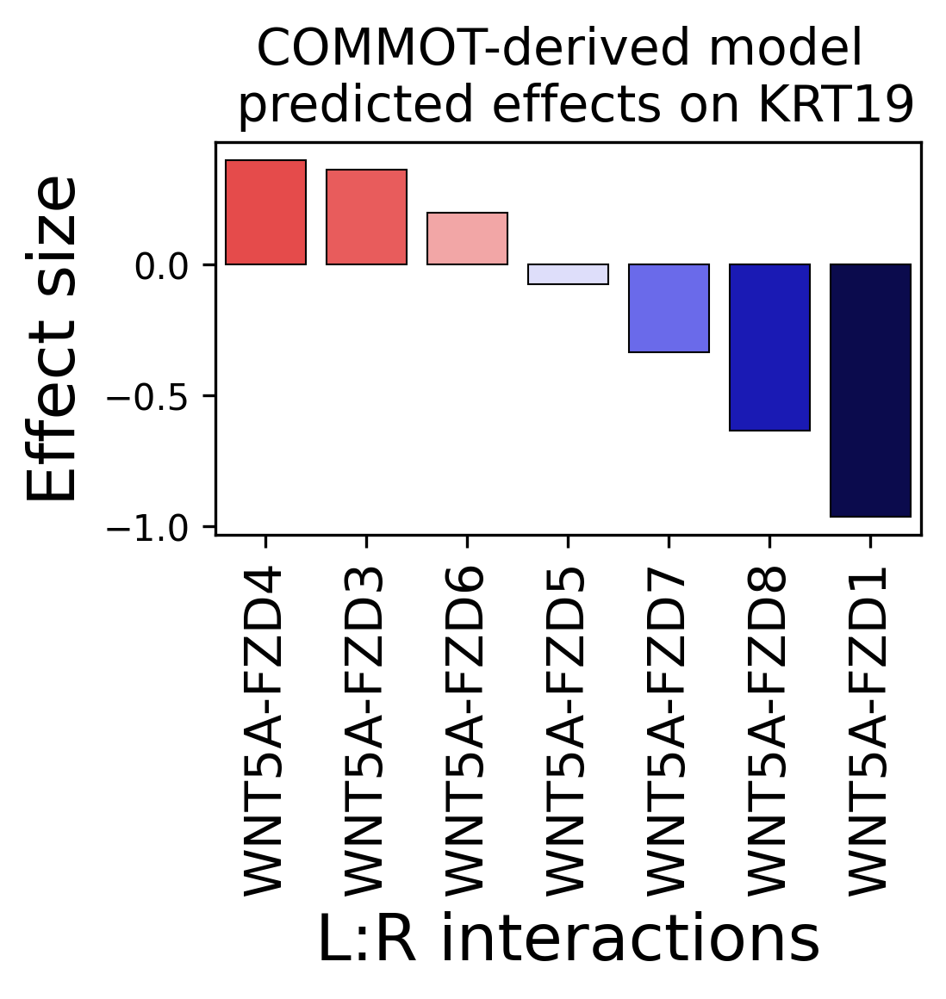

In [102]:
import matplotlib.colors as mcolors
# Use the seismic colormap
colormap = plt.get_cmap('seismic')

# Determine the colors based on the coefficients
norm = mcolors.Normalize(vmin=-1, vmax=1)
colors = [colormap(norm(value)) for value in filtered_df['coef']]

fig, ax = plt.subplots(figsize=(3.5, 2))
sns.barplot(x='Interaction', y='coef', data=filtered_df, ax=ax, palette=colors, edgecolor='black')
ax.set_title(f'COMMOT-derived model \n predicted effects on {target_gene}', fontsize=14)
ax.set_xlabel('L:R interactions', fontsize=18)
ax.set_ylabel('Effect size', fontsize=18)
plt.xticks(rotation=90, fontsize=14)
plt.yticks(fontsize=10)
plt.show()

#### KRT19 comparison- plot for the Spateo model

In [103]:
target_cells = np.where(lung_fov4_spateo[:, target_gene].X.toarray() > 0)[0]
adata_target = lung_fov4_spateo[target_cells].copy()

In [ ]:
cci_output_directory = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_CosMx_materials/CCI_outputs"
# If this directory/file do not exist (indicating during model training a different path was specified, change this below):
cci_output_id = os.path.join(cci_output_directory, f"lung_fov4_{target_gene}.csv")
target_coeffs = pd.read_csv(cci_output_id, index_col=0)
target_coeffs = target_coeffs[[c for c in target_coeffs.columns if "b_" in c]]
target_coeffs

In [ ]:
target_coeffs = target_coeffs.iloc[target_cells]
target_coeffs

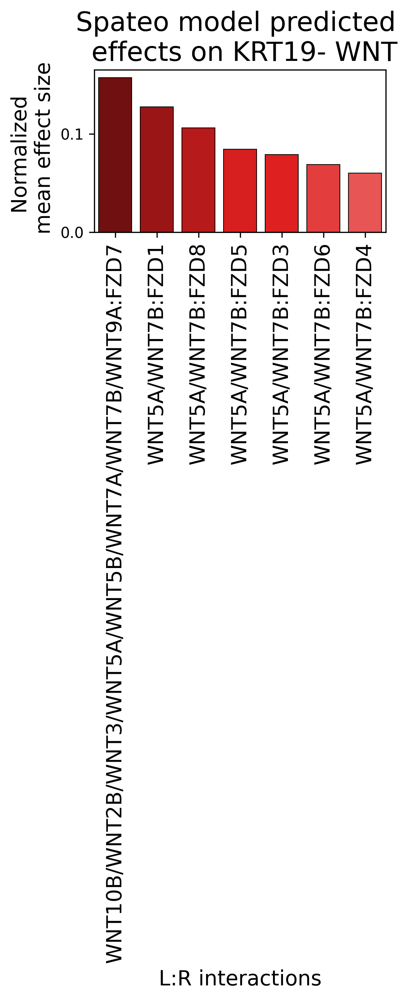

In [106]:
if target_gene == "DDR1":
    target_coeffs_sub = target_coeffs.loc[:, [col for col in target_coeffs.columns if ("CD44" in col or "_IT" in col) and "ICAM" not in col and "IGF" not in col and "MIF" not in col and "CD40" not in col]]
    target_coeffs_sub.columns = [replace_col_with_collagens(c) for c in target_coeffs_sub.columns]
    means = target_coeffs_sub.apply(lambda x: x[x > 0].mean())
    means = pd.DataFrame(means, columns=["coeff"])
    means["Interaction"] = [idx.replace("b_", "") for idx in means.index]
    means = means.sort_values('coeff', ascending=False)
    means = means.iloc[1:20]
    print(means)
    # Final set to plot:
    means = means.loc[["b_Collagens/FN1/VTN:ITGAV_ITGB8", "b_SPP1/VTN:ITGAV_ITGB5", "b_Collagens/FN1/THBS1/THBS2:ITGA3_ITGB1", "b_Collagens/SPP1:ITGA9_ITGB1", "b_CDH1/Collagens:ITGA2_ITGB1", "b_ANGPTL1/Collagens:ITGA1_ITGB1", "b_FN1/SPP1/VTN:ITGAV_ITGB1"]]

    import matplotlib.colors as mcolors
    # Use the seismic colormap
    colormap = plt.get_cmap('seismic')
    
    # Determine the colors based on the coefficients
    norm = mcolors.Normalize(vmin=-means['coeff'].max(), vmax=means['coeff'].max())
    colors = [colormap(norm(value)) for value in means['coeff']]
    
    fig, ax = plt.subplots(figsize=(3.5, 2))
    sns.barplot(x='Interaction', y='coeff', data=means, ax=ax, palette=colors, edgecolor='black')
    ax.set_title(f'Spateo model predicted \n effects on {target_gene}- ECM', fontsize=18)
    ax.set_xlabel('L:R interactions', fontsize=14)
    ax.set_ylabel('Normalized \n mean effect size', fontsize=14)
    plt.xticks(rotation=90, fontsize=14)
    plt.yticks(fontsize=10)
    plt.show()
elif target_gene == "KRT19":
    target_coeffs_sub = target_coeffs.loc[:, [col for col in target_coeffs.columns if "WNT5A" in col and "FZD" in col]]
    means = target_coeffs_sub.apply(lambda x: x[x > 0].mean())
    means = pd.DataFrame(means, columns=["coeff"])
    means["Interaction"] = [idx.replace("b_", "") for idx in means.index]
    means = means.sort_values('coeff', ascending=False)

    import matplotlib.colors as mcolors
    # Use the seismic colormap
    colormap = plt.get_cmap('seismic')
    
    # Determine the colors based on the coefficients
    norm = mcolors.Normalize(vmin=-means['coeff'].max(), vmax=means['coeff'].max())
    colors = [colormap(norm(value)) for value in means['coeff']]
    
    fig, ax = plt.subplots(figsize=(3.5, 2))
    sns.barplot(x='Interaction', y='coeff', data=means, ax=ax, palette=colors, edgecolor='black')
    ax.set_title(f'Spateo model predicted \n effects on {target_gene}- WNT', fontsize=18)
    ax.set_xlabel('L:R interactions', fontsize=14)
    ax.set_ylabel('Normalized \n mean effect size', fontsize=14)
    plt.xticks(rotation=90, fontsize=14)
    plt.yticks(fontsize=10)
    plt.show()

#### DDR1 comparison- plot for the COMMOT model

In [107]:
target_gene = "DDR1"

In [108]:
with open(os.path.join(model_dir, f"{target_gene}.pkl"), "rb") as file:
    model = pickle.load(file)

In [109]:
sm_coeffs_data = model.summary().tables[1].data
sm_coeffs_df = pd.DataFrame(sm_coeffs_data[1:], columns=sm_coeffs_data[0])
sm_coeffs_df = sm_coeffs_df.set_index(sm_coeffs_df.columns[0])
sm_coeffs_df = sm_coeffs_df.astype(float)
sm_coeffs_df

,coef,std err,z,P>|z|,[0.025,0.975]
,,,,,,
commot-cellchat-IL12A_IL12B-IL12RB1_IL12RB2,0.0765,0.178,0.429,0.668,-0.273,0.426
commot-cellchat-GDF6-BMPR1A_ACVR2A,2.4891,1.522,1.636,0.102,-0.494,5.472
commot-cellchat-GDF6-BMPR1A_BMPR2,0.4357,0.634,0.687,0.492,-0.807,1.679
commot-cellchat-CD40LG-ITGAM_ITGB2,-0.1090,0.301,-0.362,0.717,-0.699,0.481
commot-cellchat-CD40LG-ITGA5_ITGB1,0.2540,0.198,1.285,0.199,-0.133,0.641
...,...,...,...,...,...,...
commot-cellchat-PDL2,0.0169,0.069,0.244,0.807,-0.119,0.152
commot-cellchat-PECAM1,-0.0378,0.022,-1.681,0.093,-0.082,0.006
commot-cellchat-SELL,-0.0139,0.045,-0.311,0.756,-0.102,0.074


In [110]:
if target_gene == "DDR1":
    interactions = ["COL6A3-ITGA3_ITGB1", "COL4A2-ITGA2_ITGB1", "COL4A2-ITGA3_ITGB1", "COL6A1-ITGA2_ITGB1", "COL6A1-ITGA3_ITGB1", "COL9A2-ITGA3_ITGB1", "COL9A2-ITGA2_ITGB1"]
elif target_gene == "KRT19":
    interactions = [col for col in sm_coeffs_df.index if "WNT5A" in col and "FZD" in col]

matching_columns = [col for col in sm_coeffs_df.index if any(interaction in col for interaction in interactions)]
filtered_df = sm_coeffs_df.loc[matching_columns]
filtered_df

,coef,std err,z,P>|z|,[0.025,0.975]
,,,,,,
commot-cellchat-COL4A2-ITGA2_ITGB1,0.1314,0.665,0.198,0.843,-1.171,1.434
commot-cellchat-COL4A2-ITGA3_ITGB1,-0.3066,0.244,-1.258,0.208,-0.784,0.171
commot-cellchat-COL6A3-ITGA3_ITGB1,0.8995,0.264,3.405,0.001,0.382,1.417
commot-cellchat-COL9A2-ITGA2_ITGB1,0.3114,0.246,1.266,0.206,-0.171,0.794
commot-cellchat-COL9A2-ITGA3_ITGB1,0.0395,0.074,0.534,0.593,-0.105,0.184
commot-cellchat-COL6A1-ITGA2_ITGB1,-0.7916,0.423,-1.873,0.061,-1.620,0.037
commot-cellchat-COL6A1-ITGA3_ITGB1,0.1717,0.148,1.160,0.246,-0.118,0.462


In [111]:
filtered_df.index = [label.replace('commot-cellchat-', '') for label in filtered_df.index]
filtered_df = filtered_df.sort_values('coef', ascending=False)
filtered_df['Interaction'] = filtered_df.index
filtered_df

,coef,std err,z,P>|z|,[0.025,0.975],Interaction
COL6A3-ITGA3_ITGB1,0.8995,0.264,3.405,0.001,0.382,1.417,COL6A3-ITGA3_ITGB1
COL9A2-ITGA2_ITGB1,0.3114,0.246,1.266,0.206,-0.171,0.794,COL9A2-ITGA2_ITGB1
COL6A1-ITGA3_ITGB1,0.1717,0.148,1.160,0.246,-0.118,0.462,COL6A1-ITGA3_ITGB1
COL4A2-ITGA2_ITGB1,0.1314,0.665,0.198,0.843,-1.171,1.434,COL4A2-ITGA2_ITGB1
COL9A2-ITGA3_ITGB1,0.0395,0.074,0.534,0.593,-0.105,0.184,COL9A2-ITGA3_ITGB1
COL4A2-ITGA3_ITGB1,-0.3066,0.244,-1.258,0.208,-0.784,0.171,COL4A2-ITGA3_ITGB1
COL6A1-ITGA2_ITGB1,-0.7916,0.423,-1.873,0.061,-1.620,0.037,COL6A1-ITGA2_ITGB1


In [112]:
filtered_df['coef'] = pd.to_numeric(filtered_df['coef'], errors='coerce')
filtered_df = filtered_df.sort_values('coef', ascending=False)

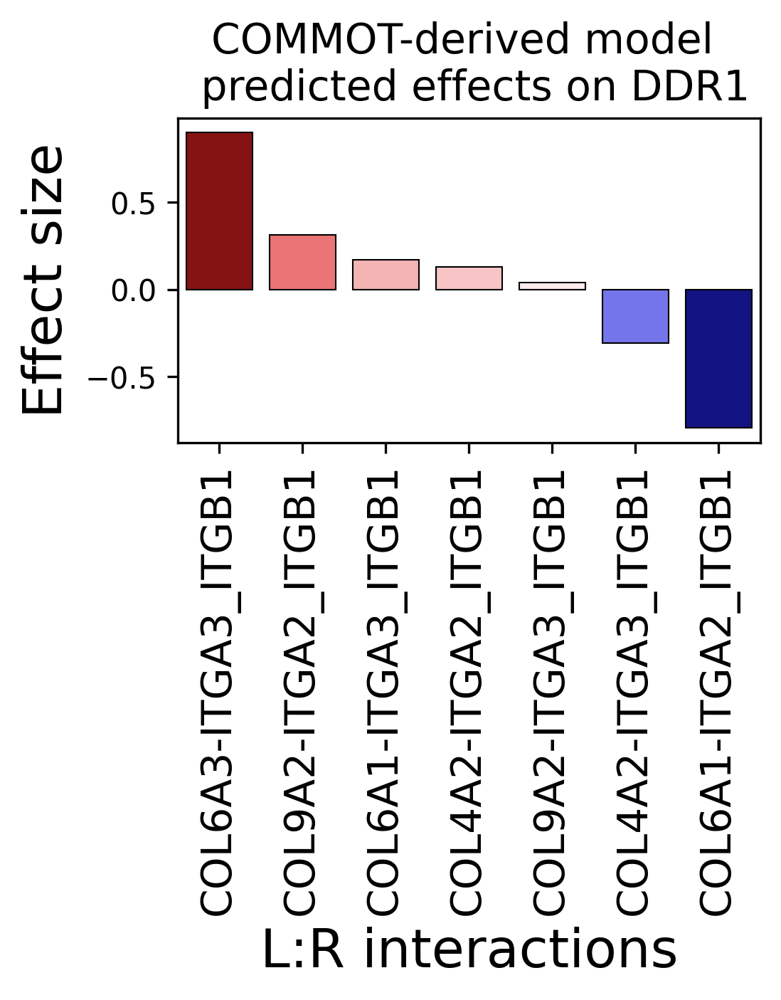

In [113]:
import matplotlib.colors as mcolors
# Use the seismic colormap
colormap = plt.get_cmap('seismic')

# Determine the colors based on the coefficients
norm = mcolors.Normalize(vmin=-1, vmax=1)
colors = [colormap(norm(value)) for value in filtered_df['coef']]

fig, ax = plt.subplots(figsize=(3.5, 2))
sns.barplot(x='Interaction', y='coef', data=filtered_df, ax=ax, palette=colors, edgecolor='black')
ax.set_title(f'COMMOT-derived model \n predicted effects on {target_gene}', fontsize=14)
ax.set_xlabel('L:R interactions', fontsize=18)
ax.set_ylabel('Effect size', fontsize=18)
plt.xticks(rotation=90, fontsize=14)
plt.yticks(fontsize=10)
plt.show()

#### DDR1 comparison- plot for the Spateo model

In [114]:
target_cells = np.where(lung_fov4_spateo[:, target_gene].X.toarray() > 0)[0]
adata_target = lung_fov4_spateo[target_cells].copy()

In [ ]:
cci_output_directory = "/home/danielyumengzhu/Single-cell-analysis/Spateo_benchmark_non-embryo_figures/fig5_CosMx_materials/CCI_outputs"
# If this directory/file do not exist (indicating during model training a different path was specified, change this below):
cci_output_id = os.path.join(cci_output_directory, f"lung_fov4_{target_gene}.csv")
target_coeffs = pd.read_csv(cci_output_id, index_col=0)
target_coeffs = target_coeffs[[c for c in target_coeffs.columns if "b_" in c]]
target_coeffs

In [ ]:
target_coeffs = target_coeffs.iloc[target_cells]
target_coeffs

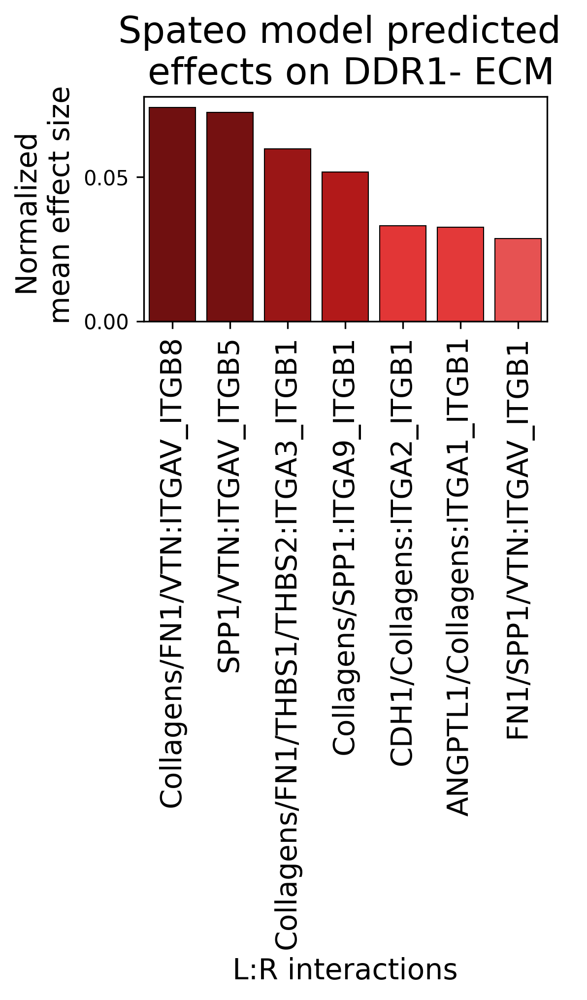

In [121]:
if target_gene == "DDR1":
    target_coeffs_sub = target_coeffs.loc[:, [col for col in target_coeffs.columns if ("CD44" in col or "_IT" in col) and "ICAM" not in col and "IGF" not in col and "MIF" not in col and "CD40" not in col]]
    target_coeffs_sub.columns = [replace_col_with_collagens(c) for c in target_coeffs_sub.columns]
    means = target_coeffs_sub.apply(lambda x: x[x > 0].mean())
    means = pd.DataFrame(means, columns=["coeff"])
    means["Interaction"] = [idx.replace("b_", "") for idx in means.index]
    means = means.sort_values('coeff', ascending=False)
    means = means.iloc[1:20]
    # Final set to plot:
    means = means.loc[["b_Collagens/FN1/VTN:ITGAV_ITGB8", "b_SPP1/VTN:ITGAV_ITGB5", "b_Collagens/FN1/THBS1/THBS2:ITGA3_ITGB1", "b_Collagens/SPP1:ITGA9_ITGB1", "b_CDH1/Collagens:ITGA2_ITGB1", "b_ANGPTL1/Collagens:ITGA1_ITGB1", "b_FN1/SPP1/VTN:ITGAV_ITGB1"]]

    import matplotlib.colors as mcolors
    # Use the seismic colormap
    colormap = plt.get_cmap('seismic')
    
    # Determine the colors based on the coefficients
    norm = mcolors.Normalize(vmin=-means['coeff'].max(), vmax=means['coeff'].max())
    colors = [colormap(norm(value)) for value in means['coeff']]
    
    fig, ax = plt.subplots(figsize=(3.5, 2))
    sns.barplot(x='Interaction', y='coeff', data=means, ax=ax, palette=colors, edgecolor='black')
    ax.set_title(f'Spateo model predicted \n effects on {target_gene}- ECM', fontsize=18)
    ax.set_xlabel('L:R interactions', fontsize=14)
    ax.set_ylabel('Normalized \n mean effect size', fontsize=14)
    plt.xticks(rotation=90, fontsize=14)
    plt.yticks(fontsize=10)
    plt.show()
elif target_gene == "KRT19":
    target_coeffs_sub = target_coeffs.loc[:, [col for col in target_coeffs.columns if "WNT5A" in col and "FZD" in col]]
    means = target_coeffs_sub.apply(lambda x: x[x > 0].mean())
    means = pd.DataFrame(means, columns=["coeff"])
    means["Interaction"] = [idx.replace("b_", "") for idx in means.index]
    means = means.sort_values('coeff', ascending=False)

    import matplotlib.colors as mcolors
    # Use the seismic colormap
    colormap = plt.get_cmap('seismic')
    
    # Determine the colors based on the coefficients
    norm = mcolors.Normalize(vmin=-means['coeff'].max(), vmax=means['coeff'].max())
    colors = [colormap(norm(value)) for value in means['coeff']]
    
    fig, ax = plt.subplots(figsize=(3.5, 2))
    sns.barplot(x='Interaction', y='coeff', data=means, ax=ax, palette=colors, edgecolor='black')
    ax.set_title(f'Spateo model predicted \n effects on {target_gene}- WNT', fontsize=18)
    ax.set_xlabel('L:R interactions', fontsize=14)
    ax.set_ylabel('Normalized \n mean effect size', fontsize=14)
    plt.xticks(rotation=90, fontsize=14)
    plt.yticks(fontsize=10)
    plt.show()